In [1]:
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import plotly as py
from plotly.subplots import make_subplots
import plotly.graph_objects as go
from plotly.offline import init_notebook_mode, iplot, plot
import plotly.express as px

from matplotlib.patches import ConnectionPatch
import numpy as np
import matplotlib as mpl
from pywaffle import Waffle


import warnings    
warnings.filterwarnings("ignore")

print("Project has been created with this version of Pandas: " ,pd. __version__," And with this version of Numpy: ",np. __version__)

Project has been created with this version of Pandas:  2.2.2  And with this version of Numpy:  1.26.4


In [2]:
df = pd.read_csv('../datasets/processed/heart_no_nans.csv')
df.head()

,State,Sex,GeneralHealth,PhysicalHealthDays,MentalHealthDays,LastCheckupTime,PhysicalActivities,HighCholesterol,HighBloodPressure,HadHeartAttack,...,RaceEthnicityCategory,AgeCategory,HeightInMeters,WeightInKilograms,BMI,AlcoholDrinkers,HIVTesting,FluVaxLast12,PneumoVaxEver,CovidPos
0,Alabama,Female,Very good,0.0,0.0,Within past 2 years (1 year but less than 2 ye...,No,No,Yes,No,...,"White only, Non-Hispanic",Age 80 or older,1.60,78.02,30.47,No,No,No,No,No
1,Alabama,Female,Very good,0.0,0.0,Within past 2 years (1 year but less than 2 ye...,Yes,Yes,Yes,No,...,"White only, Non-Hispanic",Age 80 or older,1.45,59.87,28.56,No,No,Yes,Yes,No
2,Alabama,Female,Very good,2.0,0.0,Within past 5 years (2 years but less than 5 y...,Yes,No,No,No,...,"White only, Non-Hispanic",Age 75 to 79,1.68,77.11,27.44,No,Yes,Yes,Yes,No
3,Alabama,Female,Fair,0.0,0.0,Within past year (anytime less than 12 months ...,Yes,No,Yes,No,...,"White only, Non-Hispanic",Age 75 to 79,1.73,77.11,25.85,Yes,No,No,Yes,No
4,Alabama,Female,Good,2.0,3.0,Within past year (anytime less than 12 months ...,Yes,Yes,Yes,No,...,"Black only, Non-Hispanic",Age 60 to 64,1.57,74.84,30.18,Yes,Yes,No,No,Yes


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 257697 entries, 0 to 257696
Data columns (total 37 columns):
 #   Column                     Non-Null Count   Dtype  
---  ------                     --------------   -----  
 0   State                      257697 non-null  object 
 1   Sex                        257697 non-null  object 
 2   GeneralHealth              257697 non-null  object 
 3   PhysicalHealthDays         257697 non-null  float64
 4   MentalHealthDays           257697 non-null  float64
 5   LastCheckupTime            257697 non-null  object 
 6   PhysicalActivities         257697 non-null  object 
 7   HighCholesterol            257697 non-null  object 
 8   HighBloodPressure          257697 non-null  object 
 9   HadHeartAttack             257697 non-null  object 
 10  HadAngina                  257697 non-null  object 
 11  HadStroke                  257697 non-null  object 
 12  HadAsthma                  257697 non-null  object 
 13  HadSkinCancer              25

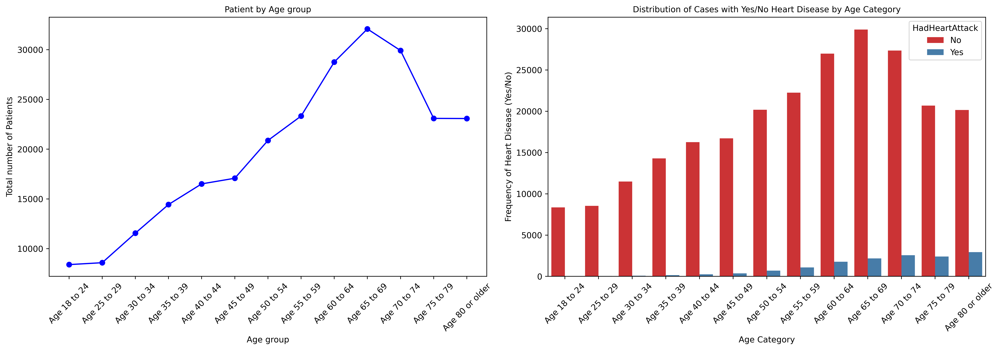

In [4]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Mengelompokkan data berdasarkan kategori usia
age_plot = df.groupby(["AgeCategory"])
Patient_groupby_age = {}
for age, group in age_plot:
    Patient_groupby_age[age] = group["AgeCategory"].count()  # Menghitung jumlah pasien per kategori usia

# Menentukan urutan kategori usia sesuai dengan data di 'AgeCategory'
ageCategory_order = ['Age 18 to 24', 'Age 25 to 29', 'Age 30 to 34', 'Age 35 to 39', 'Age 40 to 44',
                     'Age 45 to 49', 'Age 50 to 54', 'Age 55 to 59', 'Age 60 to 64', 'Age 65 to 69', 
                     'Age 70 to 74', 'Age 75 to 79', 'Age 80 or older']

# Menyiapkan sumbu X berdasarkan urutan kategori usia
x_axis = np.arange(0, len(Patient_groupby_age))

# Membuat subplot
fig, axes = plt.subplots(1, 2, figsize=(17, 6), dpi=500)

# Plot pertama: Jumlah pasien berdasarkan kategori usia
ax = axes[0]  # Mengakses axis pertama
ax.plot(x_axis, list(Patient_groupby_age.values()), marker="o", color='b')
ax.set_xticks(x_axis)
ax.set_xticklabels(ageCategory_order)
ax.set_title("Patient by Age group", fontsize=10)
ax.set_xlabel("Age group")
ax.set_ylabel("Total number of Patients")
ax.tick_params(axis='x', rotation=45)

# Plot kedua: Distribusi kasus penyakit jantung berdasarkan kategori usia (Yes/No)
ax = axes[1]  # Mengakses axis kedua

# Filter data untuk kasus 'Yes' dan 'No' pada kolom 'HeartDisease'
sns.countplot(data=df, x='AgeCategory', hue='HadHeartAttack', palette='Set1', order=ageCategory_order, ax=ax)
ax.set_title("Distribution of Cases with Yes/No Heart Disease by Age Category", fontsize=10)
ax.set_xlabel("Age Category")
ax.set_ylabel("Frequency of Heart Disease (Yes/No)")
ax.tick_params(axis='x', rotation=45)

# Menampilkan plot
plt.tight_layout()
plt.show()

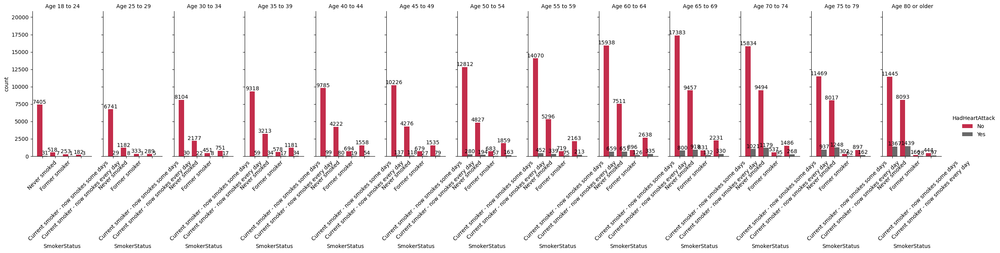

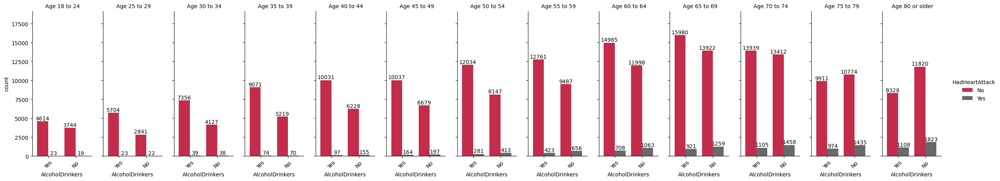

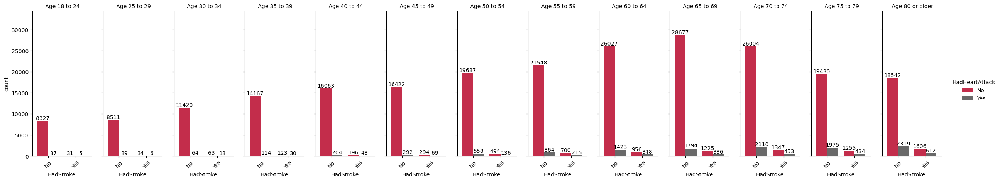

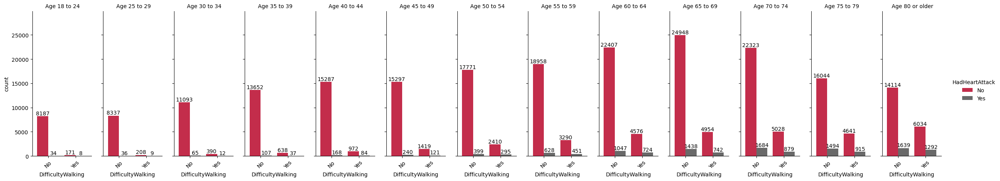

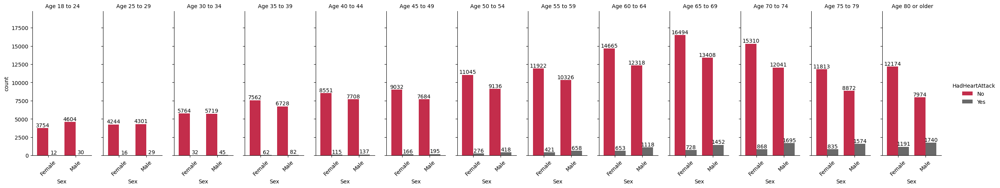

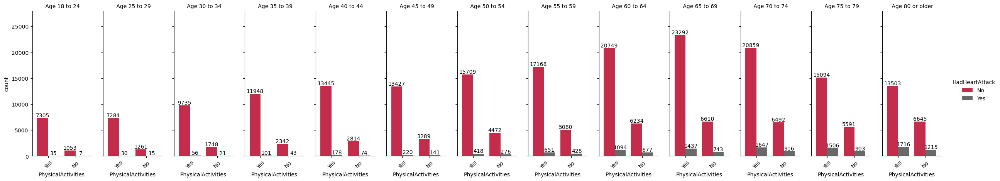

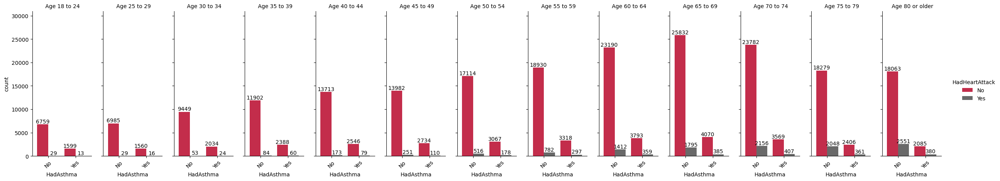

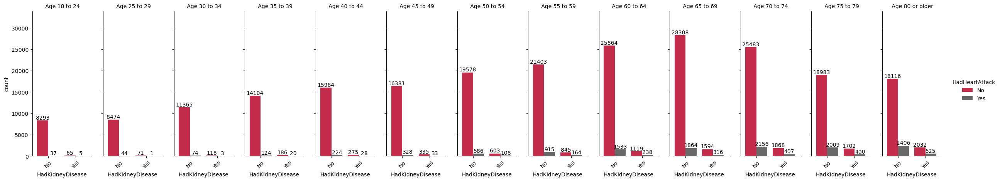

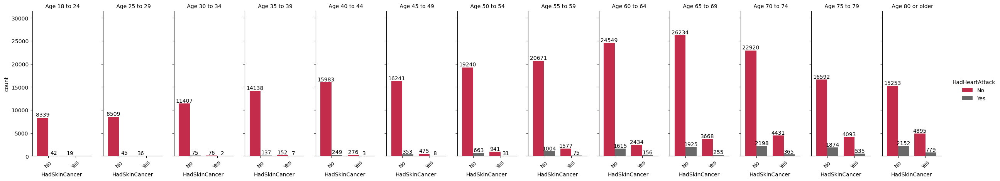

In [5]:
# Menentukan urutan kategori usia
ageCategory_order = ['Age 18 to 24', 'Age 25 to 29', 'Age 30 to 34', 'Age 35 to 39', 'Age 40 to 44',
                     'Age 45 to 49', 'Age 50 to 54', 'Age 55 to 59', 'Age 60 to 64', 'Age 65 to 69', 
                     'Age 70 to 74', 'Age 75 to 79', 'Age 80 or older']

# Daftar kolom yang ingin dianalisis
column_name = ['SmokerStatus', 'AlcoholDrinkers', 'HadStroke', 'DifficultyWalking', 'Sex', 'PhysicalActivities',
               'HadAsthma', 'HadKidneyDisease', 'HadSkinCancer']

# Warna untuk visualisasi umum
color_catplot = ["Crimson", "DimGray"]

# Kamus warna khusus untuk SmokerStatus
smoker_colors = {
    "Current smoker - now smokes every day": "Crimson",
    "Current smoker - now smokes some days": "DarkOrange", 
    "Former smoker": "ForestGreen",
    "Never smoked": "DodgerBlue"
}

# Singkatan untuk nilai SmokerStatus (untuk legend yang lebih ringkas)
smoker_short_names = {
    "Current smoker - now smokes every day": "Every day smoker",
    "Current smoker - now smokes some days": "Some days smoker", 
    "Former smoker": "Former smoker",
    "Never smoked": "Never smoked"
}

# Mengurutkan DataFrame berdasarkan kategori usia
df_sorted = df.sort_values('AgeCategory')
x_axis = np.arange(len(ageCategory_order))
X_tuple = tuple(tuple(x_axis))

for column in column_name:
    fig = plt.figure(figsize=(24, 18), dpi=500)
    
    # Menyiapkan grid untuk subplot
    gs = fig.add_gridspec(10, 24)
    gs.update(wspace=1.5, hspace=0.5)
    
    # Subplot untuk lineplot dan catplot
    ax2 = fig.add_subplot(gs[0:3, 5:18])  # lineplot di atas
    ax1 = fig.add_subplot(gs[4:5, 0:])    # catplot di bawah
    
    # axes list
    axes = [ax1, ax2]
    
    # Setting tampilan axes
    for ax in axes:
        ax.axes.get_yaxis().set_visible(False)
        ax.set_facecolor('#FFFFFF')
        
        for loc in ['left', 'right', 'top', 'bottom']:
            ax.spines[loc].set_visible(False)
    
    fig.patch.set_facecolor('#FFFFFF')
    
    ax1.axes.get_xaxis().set_visible(False)
    ax2.axes.get_yaxis().set_visible(True)
    ax1.set_xlim(xmin=-250, xmax=2000)
    ax1.set_ylim(ymin=-1, ymax=3.5)
    
    # Catplot untuk hubungan dengan HadHeartAttack
    g = sns.catplot(x=column, hue="HadHeartAttack", col="AgeCategory", data=df_sorted,
                    kind="count", height=5, aspect=.4, palette=color_catplot, ax=ax1)
    
    # Menyesuaikan tampilan catplot
    for ax in g.axes.flat[1:]:
        sns.despine(ax=ax, left=False)
    
    for ax in g.axes.flat:
        ax.set_xlabel(ax.get_title())
        ax.set_title('')
        ax.margins(x=0.1)
        ax.tick_params(axis='x', labelrotation=45)
    
    # Menambahkan label pada bar
    for ax in g.axes.ravel():
        for c in ax.containers:
            ax.bar_label(c, label_type='edge')
        ax.margins(y=0.2)
    
    # Judul untuk setiap kolom
    g.set_titles(col_template=' {col_name}')
    plt.subplots_adjust(wspace=0.2, bottom=0.18, left=0.08)
    g.set_xlabels()
    
    try:
        # Mendapatkan nilai unik dalam kolom
        unique_values = sorted(df_sorted[column].unique())
        
        # Pilihan warna berdasarkan kolom
        if column == 'SmokerStatus' and len(unique_values) > 2:
            colors_to_use = []
            for val in unique_values:
                if val in smoker_colors:
                    colors_to_use.append(smoker_colors[val])
                else:
                    colors_to_use.append("gray")
            
            # Plot semua nilai SmokerStatus
            for i, value in enumerate(unique_values):
                data = df_sorted[df_sorted[column] == value].groupby('AgeCategory').size()
                data = data.reindex(ageCategory_order).fillna(0)
                
                color = colors_to_use[i] if i < len(colors_to_use) else "gray"
                
                # Plot lineplot tanpa label nilai (untuk mengurangi kepadatan)
                sns.lineplot(x=ageCategory_order, y=data.values, marker="o", color=color, 
                           linewidth=2.5, ms=12, mew=4, ax=ax2)
        else:
            # Untuk kolom lain, gunakan semua nilai uniknya (tidak dibatasi)
            colors = plt.cm.tab10(np.linspace(0, 1, len(unique_values)))
            
            for i, value in enumerate(unique_values):
                data = df_sorted[df_sorted[column] == value].groupby('AgeCategory').size()
                data = data.reindex(ageCategory_order).fillna(0)
                
                color = color_catplot[i] if i < len(color_catplot) else colors[i]
                
                # Plot lineplot tanpa label nilai
                sns.lineplot(x=ageCategory_order, y=data.values, marker="o", color=color, 
                           linewidth=2.5, ms=12, mew=4, ax=ax2)

    except Exception as e:
        print(f"Error in creating lineplot for {column}: {e}")
    
    # Menyesuaikan tampilan lineplot
    ax2.set_xlabel('AgeCategory', fontdict={'font': 'Serif', 'color': 'black', 'size': 16})
    ax2.set_xticks(x_axis)
    ax2.set_xticklabels(ageCategory_order, rotation=45)
    ax2.set_ylabel('Frequency', fontdict={'font': 'Serif', 'color': 'black', 'size': 16})
    
    # Menambahkan teks pada figure
    fig.text(0.4, 0.985, column + " Analysis", {'font': 'cursive', 'weight': 'bold', 'color': 'Navy', 'size': 35})
    fig.text(0.4, 1.1, " ")
    
    # Legend untuk semua kolom
    legend_x = 0.78  # Lebih ke kanan untuk menghindari tumpang tindih
    legend_y = 0.83
    legend_spacing = 0.025
    
    if column == 'SmokerStatus':
        # Legend dengan nama sebenarnya untuk SmokerStatus
        for i, (value, color) in enumerate(smoker_colors.items()):
            # Menggunakan singkatan atau nama sebenarnya untuk mengurangi panjang teks
            display_value = smoker_short_names.get(value, value)
            data = df_sorted[df_sorted[column] == value].groupby('AgeCategory').size()
            data_sum = int(data.sum())
            
            # Legend dengan nama sebenarnya dan jumlah
            fig.text(legend_x, legend_y - i*legend_spacing, f'■  {display_value} ({data_sum})', 
                    {'font': 'Serif', 'weight': 'bold', 'size': '12', 'style': 'normal', 'color': color})
    else:
        # Legend untuk kolom lainnya
        for i, value in enumerate(unique_values):
            if i >= 5:  # Batasi hingga 5 nilai untuk menghindari legend yang terlalu panjang
                break
                
            data = df_sorted[df_sorted[column] == value].groupby('AgeCategory').size()
            data_sum = int(data.sum())
            color = color_catplot[i] if i < len(color_catplot) else colors[i]
            
            # Format text untuk legend
            if len(str(value)) > 10:  # Jika teks terlalu panjang
                legend_text = f'■  {str(value)[:10]}... ({data_sum})'
            else:
                legend_text = f'■  {value} ({data_sum})'
                
            fig.text(legend_x, legend_y - i*legend_spacing, legend_text, 
                    {'font': 'Serif', 'weight': 'bold', 'size': '12', 'style': 'normal', 
                     'color': color})
    
    fig.text(0.3, 0.905, f'Distribution {column} by age group', {'font': 'Serif', 'weight': 'bold', 'size': '18', 'style': 'normal', 'color': "DimGray"})
    fig.text(0.25, 0.515, f'Distribution of Cases with Yes/No heart attack according to AgeCategory', {'font': 'Serif', 'weight': 'bold', 'size': '18', 'style': 'normal', 'color': "DimGray"})
    
    plt.show()

In [6]:
%pip install pywaffle

Note: you may need to restart the kernel to use updated packages.


In [7]:
def plot_icons():
    
    ########################################################################
    #First Plot
    ########################################################################



    # Mengambil data untuk smoker status berdasarkan heart attack
    healthy_gen = df[df['HadHeartAttack'] == 'No']['SmokerStatus'].value_counts()
    heartdisease_gen = df[df['HadHeartAttack'] == 'Yes']['SmokerStatus'].value_counts()

    # Membuat figure dan grid
    fig = plt.figure(figsize = (22,17), dpi=144)
    gs = fig.add_gridspec(30,54)
    gs.update(wspace = 1, hspace = 0.05)

    # Membuat subplot
    ax1 = fig.add_subplot(gs[8:20,5:40]) # Pie plot 
    ax2 = fig.add_subplot(gs[0:5,0:20]) # left plot
    ax3 = fig.add_subplot(gs[0:5, 30:50]) # right plot 
    ax4 = fig.add_subplot(gs[8:20, 35:50]) # bar plot

    # Axes list
    axes = [ax1,ax2, ax3,ax4]

    # Setting axes
    for ax in axes:
        ax.axes.get_yaxis().set_visible(False)
        ax.set_facecolor('#FFFFFF')
        
        for loc in ['left', 'right', 'top', 'bottom']:
            ax.spines[loc].set_visible(False)

    fig.patch.set_facecolor('#FFFFFF')

    # Hide axes
    ax1.axes.get_xaxis().set_visible(False)
    ax1.axes.get_yaxis().set_visible(False)
    ax2.axes.get_xaxis().set_visible(False)
    ax2.axes.get_yaxis().set_visible(False)
    ax3.axes.get_xaxis().set_visible(False)
    ax3.axes.get_yaxis().set_visible(False)

    # Pie chart parameters
    ratios = df['SmokerStatus'].value_counts()
    labels = df['SmokerStatus'].value_counts().index
    explode = [0.1, 0, 0, 0] # Tambah sesuai jumlah kategori smoker
    angle = -180 * ratios[0]
    ax1.pie(ratios, autopct='%1.1f%%', startangle=angle,labels=labels, explode=explode, colors=['Crimson', 'DimGray', 'ForestGreen', 'DodgerBlue'])

    # Bar chart parameters
    xpos = 0
    bottom = 0
    ratios = df[df["SmokerStatus"]=="Current smoker - now smokes every day"]["AgeCategory"].value_counts()
    width = .2
    colors=[ "#0000ff", "#9999ff", "#cda5f3","#ff4dff", "#ff99ff", "#ff6680", "#ff9999", "#ffbebe", "#f6abc6","#f3c6a5", "#ffdb99","#ffe7be", "#ffffbe"] 

    for j in range(len(ratios)):
        height = ratios[j]
        ax4.bar(xpos, height, width, bottom=bottom, color=colors[j])
        ypos = bottom + ax4.patches[j].get_height() / 2
        bottom += height
        ax4.text(xpos, ypos, "%d%%" % ((ax4.patches[j].get_height() /sum(df[df["SmokerStatus"]=='Current smoker - now smokes every day']["AgeCategory"].value_counts() ))* 100),
                ha='center')

    ax4.set_title('Age Category')
    ax4.legend(df['AgeCategory'].unique())
    ax4.axis('off')
    ax4.set_xlim(- 2.5 * width, 2.5 * width)

    # Connection lines
    theta1, theta2 = ax1.patches[1].theta2, ax1.patches[1].theta1
    center, r = ax1.patches[1].center, ax1.patches[1].r
    bar_height = sum([item.get_height() for item in ax4.patches])

    # Top connecting line
    x = r * np.cos(np.pi / 180 * theta2) + center[0]
    y = np.sin(np.pi / 180 * theta2) + center[1]
    con = ConnectionPatch(xyA=(- width / 2, bar_height), xyB=(x, y),
                        coordsA="data", coordsB="data", axesA=ax4, axesB=ax1)
    con.set_color([0, 0, 0])
    con.set_linewidth(2)
    ax4.add_artist(con)

    # Bottom connecting line
    x = r * np.cos(np.pi / 180 * theta1) + center[0]
    y = np.sin(np.pi / 180 * theta1) + center[1]
    con = ConnectionPatch(xyA=(- width / 2, 0), xyB=(x, y), coordsA="data",
                        coordsB="data", axesA=ax4, axesB=ax1)
    con.set_color([0, 0, 0])
    ax4.add_artist(con)
    con.set_linewidth(2)

    # Text annotations
    ax1.text(-3.5,0.1, "The bar graph clearly shows:" +"\n"+"\n"+
                    "11% of everyday smokers are" +"\n"+"in the age group of 55-59 years" +"\n"+"\n"+
                        "2% of everyday smokers are"+"\n"+"between 25 and 29 years old ", {'font':'cursive','color':'Navy' , 'size':'20'})

    # Waffle charts
    count = df['SmokerStatus'].value_counts()

    # Left waffle (Never smoked)
    Waffle.make_waffle(ax=ax2,
            values=[healthy_gen.loc["Never smoked"]/2500, heartdisease_gen.loc["Never smoked"]/2500],
            rows=6,
            columns=7,
            rounding_rule="floor",
            icons=['ban-smoking', 'ban-smoking'],
            icon_legend=True,
            colors=["black", "red"],
            interval_ratio_x=0.01,
            interval_ratio_y=0.75)

    ax2.text(0, 1.50,f'Amount of Never Smokers is about {round(count["Never smoked"]/len(df)*100,2)}%', 
            {'font':'cursive','color': 'black', 'size':18})
    ax2.text(0, 1.32,f'Among all Never Smokers {round(heartdisease_gen["Never smoked"]/count["Never smoked"]*100, 2)}% have Heart disease',
            {'font':'Serif','color': 'red', 'size':18},alpha = 0.7)

    # Right waffle (Current everyday smoker)  
    Waffle.make_waffle(ax=ax3,
            values=[healthy_gen.loc["Current smoker - now smokes every day"]/2500, 
                    heartdisease_gen.loc["Current smoker - now smokes every day"]/2500],
            rows=6,
            columns=7,
            rounding_rule="floor",
            icons=['smoking', 'smoking'],
            icon_legend=True,
            colors=["black", "red"],
            interval_ratio_x=0.05,
            interval_ratio_y=0.75)

    ax3.text(0, 1.50,f'Amount of Current Every Day Smokers is about {round(count["Current smoker - now smokes every day"]/len(df)*100,2)}%',
            {'font':'cursive','color': 'black', 'size':18})
    ax3.text(0, 1.32,f'Among all Current Every Day Smokers {round(heartdisease_gen["Current smoker - now smokes every day"]/count["Current smoker - now smokes every day"]*100, 2)}% have Heart disease',
            {'font':'Serif','color': 'red', 'size':18},alpha = 0.7)

    # Figure text
    fig.text(0.123,1.02,'If they smoke every day, their chances of having heart disease increase significantly.',
            {'font':'Serif','color': 'navy', 'size':22}, alpha=0.9)
    fig.text(0.37,1.085,'Smoking Status Analysis',{'font':'cursive', 'weight':'bold','color': 'Navy', 'size':35})
    fig.text(0.35,1.15, ' ', {'font':'Serif', 'size':'16','color': 'black'})
    fig.text(0.08,1.05, ' ', {'font':'Serif', 'size':'16','color': 'black'})
    fig.text(0.92,1.05, ' ', {'font':'Serif', 'size':'16','color': 'black'})
    fig.show()


    
    ########################################################################
    # Plot 2
    ########################################################################



    # Get counts for alcohol drinkers vs non-drinkers by heart attack status  
    healthy_gen = df[df['HadHeartAttack'] == 'No']['AlcoholDrinkers'].value_counts()
    heartdisease_gen = df[df['HadHeartAttack'] == 'Yes']['AlcoholDrinkers'].value_counts()

    # Create figure and subplots
    fig2 = plt.figure(figsize = (22,17), dpi=144)
    gs = fig2.add_gridspec(30,54)
    gs.update(wspace = 1, hspace = 0.05)

    ax1 = fig2.add_subplot(gs[8:20,5:40]) # Pie plot
    ax2 = fig2.add_subplot(gs[0:5,0:20]) # left plot
    ax3 = fig2.add_subplot(gs[0:5, 30:50]) # right plot
    ax4 = fig2.add_subplot(gs[8:20, 35:50]) # bar plot

    # Axes settings
    axes = [ax1,ax2, ax3,ax4]
    for ax in axes:
        ax.axes.get_yaxis().set_visible(False)
        ax.set_facecolor('#FFFFFF')
        
        for loc in ['left', 'right', 'top', 'bottom']:
            ax.spines[loc].set_visible(False)

    fig2.patch.set_facecolor('#FFFFFF')

    ax1.axes.get_xaxis().set_visible(False)
    ax1.axes.get_yaxis().set_visible(False)
    ax2.axes.get_xaxis().set_visible(False)
    ax2.axes.get_yaxis().set_visible(False)
    ax3.axes.get_xaxis().set_visible(False)
    ax3.axes.get_yaxis().set_visible(False)

    # Pie chart
    ratios = df['AlcoholDrinkers'].value_counts()
    labels = df['AlcoholDrinkers'].value_counts().index
    explode = [0.1, 0]
    angle = -180 * ratios[0]
    ax1.pie(ratios, autopct='%1.1f%%', startangle=angle, labels=labels, explode=explode, colors=['Crimson', 'DimGray'])

    # Bar chart
    xpos = 0
    bottom = 0
    ratios = df[df["AlcoholDrinkers"]=="Yes"]["AgeCategory"].value_counts()
    width = .2
    colors=["#0000ff", "#9999ff", "#cda5f3","#ff4dff", "#ff99ff", "#ff6680", "#ff9999", "#ffbebe", "#f6abc6","#f3c6a5", "#ffdb99","#ffe7be", "#ffffbe"]

    for j in range(len(ratios)):
        height = ratios[j]
        ax4.bar(xpos, height, width, bottom=bottom, color=colors[j])
        ypos = bottom + ax4.patches[j].get_height() / 2
        bottom += height
        ax4.text(xpos, ypos, "%d%%" % ((ax4.patches[j].get_height() /sum(df[df["AlcoholDrinkers"]=='Yes']["AgeCategory"].value_counts() ))* 100),
                ha='center')

    ax4.set_title('Age Category')
    ax4.legend(df['AgeCategory'].unique())
    ax4.axis('off')
    ax4.set_xlim(- 2.5 * width, 2.5 * width)

    # Connection lines
    theta1, theta2 = ax1.patches[0].theta2, ax1.patches[0].theta1
    center, r = ax1.patches[0].center, ax1.patches[0].r
    bar_height = sum([item.get_height() for item in ax4.patches])

    # Top connecting line
    x = r * np.cos(np.pi / 180 * theta2) + center[0]
    y = np.sin(np.pi / 180 * theta2) + center[1]
    con = ConnectionPatch(xyA=(- width / 2, bar_height), xyB=(x, y),
                        coordsA="data", coordsB="data", axesA=ax4, axesB=ax1)
    con.set_color([0, 0, 0])
    con.set_linewidth(2)
    ax4.add_artist(con)

    # Bottom connecting line
    x = r * np.cos(np.pi / 180 * theta1) + center[0]
    y = np.sin(np.pi / 180 * theta1) + center[1]
    con = ConnectionPatch(xyA=(- width / 2, 0), xyB=(x, y), coordsA="data",
                        coordsB="data", axesA=ax4, axesB=ax1)
    con.set_color([0, 0, 0])
    ax4.add_artist(con)
    con.set_linewidth(2)

    # Text annotations
    ax1.text(-3.5,0.1, "The bar graph clearly shows:" +"\n"+"\n"+
                    "10% of alcohol drinkers are" +"\n"+"in the age group of 55-59 years" +"\n"+"\n"+
                        "3% of alcohol drinkers are"+"\n"+"between 25 and 29 years old ", {'font':'cursive','color':'Navy' , 'size':'20'})

    # Left waffle chart
    count = df['AlcoholDrinkers'].value_counts()

    Waffle.make_waffle(ax=ax2,
            values=[healthy_gen.loc[df['AlcoholDrinkers'].unique()[0]]/2500, heartdisease_gen.loc[df['AlcoholDrinkers'].unique()[0]]/2500],
            rows=6,
            columns=7,
            rounding_rule="floor",
            icons=['ban', 'ban'],
            icon_legend=True, 
            colors=["black", "red"],
            interval_ratio_x=0.01,
            interval_ratio_y=0.75)

    ax2.text(0, 1.50,f'Amount of non-drinkers is about {round(count["No"]/len(df)*100,2)}%', {'font':'cursive','color': 'black', 'size':18})
    ax2.text(0, 1.32,f'Among all non-drinkers {round(heartdisease_gen["No"]/count["No"]*100, 2)}% had heart attacks', {'font':'Serif','color': 'red', 'size':18},alpha = 0.7)

    # Right waffle chart
    Waffle.make_waffle(ax=ax3,
            values=[healthy_gen.loc[df['AlcoholDrinkers'].unique()[1]]/2500, heartdisease_gen.loc[df['AlcoholDrinkers'].unique()[1]]/2500],
            rows=6,
            columns=7,
            rounding_rule="floor",
            icons=['champagne-glasses', 'champagne-glasses'],
            icon_legend=True,
            colors=["black", "red"], 
            interval_ratio_x=0.05,
            interval_ratio_y=0.75)

    ax3.text(0, 1.50,f'Amount of drinkers is about {round(count["Yes"]/len(df)*100,2)}%', {'font':'cursive','color': 'black', 'size':18})
    ax3.text(0, 1.32,f'Among all drinkers {round(heartdisease_gen["Yes"]/count["Yes"]*100, 2)}% had heart attacks', {'font':'Serif','color': 'red', 'size':18},alpha = 0.7)

    # Figure text
    fig2.text(0.123,1.02,'Alcohol drinkers appear to have a slightly lower risk of heart attacks.',{'font':'Serif','color': 'navy', 'size':22}, alpha=0.9)
    fig2.text(0.37,1.085,'Alcohol Drinking Analysis',{'font':'cursive', 'weight':'bold','color': 'Navy', 'size':35})
    fig2.text(0.35,1.25, ' ', {'font':'Serif', 'size':'16','color': 'black'})
    fig2.text(0.08,1.05, ' ', {'font':'Serif', 'size':'16','color': 'black'})
    fig2.text(0.92,1.05, ' ', {'font':'Serif', 'size':'16','color': 'black'})

    fig2.show()
    
    
    ########################################################################
    # Plot 3
    ########################################################################



    # Get counts for stroke vs non-stroke by heart attack status
    healthy_gen = df[df['HadHeartAttack'] == 'No']['HadStroke'].value_counts()
    heartdisease_gen = df[df['HadHeartAttack'] == 'Yes']['HadStroke'].value_counts()

    # Create figure and subplots
    fig3 = plt.figure(figsize=(22,17), dpi=144)
    gs = fig3.add_gridspec(30,54)
    gs.update(wspace=1, hspace=0.05)

    # Create subplots
    ax1 = fig3.add_subplot(gs[8:20,5:40]) # Pie plot
    ax2 = fig3.add_subplot(gs[0:5,0:20]) # left plot
    ax3 = fig3.add_subplot(gs[0:5, 30:50]) # right plot
    ax4 = fig3.add_subplot(gs[8:20, 35:50]) # bar plot

    # Axes settings
    axes = [ax1,ax2, ax3,ax4]
    for ax in axes:
        ax.axes.get_yaxis().set_visible(False)
        ax.set_facecolor('#FFFFFF')
        
        for loc in ['left', 'right', 'top', 'bottom']:
            ax.spines[loc].set_visible(False)

    fig3.patch.set_facecolor('#FFFFFF')

    ax1.axes.get_xaxis().set_visible(False)
    ax1.axes.get_yaxis().set_visible(False)
    ax2.axes.get_xaxis().set_visible(False)
    ax2.axes.get_yaxis().set_visible(False)
    ax3.axes.get_xaxis().set_visible(False)
    ax3.axes.get_yaxis().set_visible(False)

    # Pie chart
    ratios = df['HadStroke'].value_counts()
    labels = df['HadStroke'].value_counts().index
    explode = [0.1, 0]
    angle = -180 * ratios[0]
    ax1.pie(ratios, autopct='%1.1f%%', startangle=angle, labels=labels, explode=explode, colors=['Crimson', 'DimGray'])

    # Bar chart
    xpos = 0
    bottom = 0
    ratios = df[df["HadStroke"]=="Yes"]["AgeCategory"].value_counts()
    width = .2
    colors=["#0000ff", "#9999ff", "#cda5f3","#ff4dff", "#ff99ff", "#ff6680", "#ff9999", "#ffbebe", "#f6abc6","#f3c6a5", "#ffdb99","#ffe7be", "#ffffbe"]

    for j in range(len(ratios)):
        height = ratios[j]
        ax4.bar(xpos, height, width, bottom=bottom, color=colors[j])
        ypos = bottom + ax4.patches[j].get_height() / 2
        bottom += height
        ax4.text(xpos, ypos, "%d%%" % ((ax4.patches[j].get_height() /sum(df[df["HadStroke"]=='Yes']["AgeCategory"].value_counts() ))* 100),
                ha='center')

    ax4.set_title('Age Category')
    ax4.legend(df['AgeCategory'].unique())
    ax4.axis('off')
    ax4.set_xlim(- 2.5 * width, 2.5 * width)

    # Connection lines
    theta1, theta2 = ax1.patches[0].theta2, ax1.patches[0].theta1
    center, r = ax1.patches[0].center, ax1.patches[0].r
    bar_height = sum([item.get_height() for item in ax4.patches])

    # Top connecting line
    x = r * np.cos(np.pi / 180 * theta2) + center[0]
    y = np.sin(np.pi / 180 * theta2) + center[1]
    con = ConnectionPatch(xyA=(- width / 2, bar_height), xyB=(x, y),
                        coordsA="data", coordsB="data", axesA=ax4, axesB=ax1)
    con.set_color([0, 0, 0])
    con.set_linewidth(2)
    ax4.add_artist(con)

    # Bottom connecting line
    x = r * np.cos(np.pi / 180 * theta1) + center[0]
    y = np.sin(np.pi / 180 * theta1) + center[1]
    con = ConnectionPatch(xyA=(- width / 2, 0), xyB=(x, y), coordsA="data",
                        coordsB="data", axesA=ax4, axesB=ax1)
    con.set_color([0, 0, 0])
    ax4.add_artist(con)
    con.set_linewidth(2)

    # Text annotations
    ax1.text(-3.5,0.1, "The bar graph clearly shows:" +"\n"+"\n"+
                    "19% of people who have had stroke are" +"\n"+"in the age group of 55-59 years" +"\n"+"\n"+
                        "0% of people who have had stroke are"+"\n"+"between 25 and 29 years old ", 
            {'font':'cursive','color':'Navy' , 'size':'20'})

    # Left waffle chart
    count = df['HadStroke'].value_counts()

    Waffle.make_waffle(ax=ax2,
            values=[healthy_gen.loc["No"]/2500, heartdisease_gen.loc["No"]/2500],
            rows=6,
            columns=7,
            rounding_rule="floor",
            icons=['heart', 'heart'],
            icon_legend=True,
            colors=["black", "red"],
            interval_ratio_x=0.01,
            interval_ratio_y=0.75)

    ax2.text(0, 1.50,f'Amount of people who have not had stroke is about {round(count["No"]/len(df)*100,2)}%', 
            {'font':'cursive','color': 'black', 'size':18})
    ax2.text(0, 1.32,f'Among them {round(heartdisease_gen["No"]/count["No"]*100, 2)}% had heart attacks', 
            {'font':'Serif','color': 'red', 'size':18},alpha = 0.7)

    # Right waffle chart
    Waffle.make_waffle(ax=ax3,
            values=[healthy_gen.loc["Yes"]/2500, heartdisease_gen.loc["Yes"]/2500],
            rows=6,
            columns=7,
            rounding_rule="floor",
            icons=['heart-crack', 'heart-crack'],
            icon_legend=True,
            colors=["black", "red"],
            interval_ratio_x=0.05,
            interval_ratio_y=0.75)

    ax3.text(0, 1.50,f'Amount of people who have had stroke is about {round(count["Yes"]/len(df)*100,2)}%', 
            {'font':'cursive','color': 'black', 'size':18})
    ax3.text(0, 1.32,f'Among them {round(heartdisease_gen["Yes"]/count["Yes"]*100, 2)}% had heart attacks', 
            {'font':'Serif','color': 'red', 'size':18},alpha = 0.7)

    # Figure text
    fig3.text(0.123,1.02,'There is a clear indication that if they have had a stroke their chances of having a heart attack\n\
                        increase by about 28%.',{'font':'Serif','color': 'navy', 'size':22}, alpha=0.9)
    fig3.text(0.37,1.085,'Stroke Analysis',{'font':'cursive', 'weight':'bold','color': 'Navy', 'size':35})
    fig3.text(0.35,1.25, ' ', {'font':'Serif', 'size':'16','color': 'black'})
    fig3.text(0.08,1.05, ' ', {'font':'Serif', 'size':'16','color': 'black'})
    fig3.text(0.92,1.05, ' ', {'font':'Serif', 'size':'16','color': 'black'})

    fig3.show()

    
    
    ########################################################################
    # Plot 4
    ########################################################################


    # Get counts for difficulty walking by heart attack status
    healthy_gen = df[df['HadHeartAttack'] == 'No']['DifficultyWalking'].value_counts()
    heartdisease_gen = df[df['HadHeartAttack'] == 'Yes']['DifficultyWalking'].value_counts()

    # Create figure and subplots
    fig4 = plt.figure(figsize=(22,17), dpi=144)
    gs = fig4.add_gridspec(30,54)
    gs.update(wspace=1, hspace=0.05)

    # Create subplots
    ax1 = fig4.add_subplot(gs[8:20,5:40]) # Pie plot
    ax2 = fig4.add_subplot(gs[0:5,0:20]) # left plot
    ax3 = fig4.add_subplot(gs[0:5, 30:50]) # right plot
    ax4 = fig4.add_subplot(gs[8:20, 35:50]) # bar plot

    # Axes settings
    axes = [ax1,ax2, ax3,ax4]
    for ax in axes:
        ax.axes.get_yaxis().set_visible(False)
        ax.set_facecolor('#FFFFFF')
        
        for loc in ['left', 'right', 'top', 'bottom']:
            ax.spines[loc].set_visible(False)

    fig4.patch.set_facecolor('#FFFFFF')

    ax1.axes.get_xaxis().set_visible(False)
    ax1.axes.get_yaxis().set_visible(False)
    ax2.axes.get_xaxis().set_visible(False)
    ax2.axes.get_yaxis().set_visible(False)
    ax3.axes.get_xaxis().set_visible(False)
    ax3.axes.get_yaxis().set_visible(False)

    # Pie chart
    ratios = df['DifficultyWalking'].value_counts()
    labels = df['DifficultyWalking'].value_counts().index
    explode = [0.1, 0]
    angle = -180 * ratios[0]
    ax1.pie(ratios, autopct='%1.1f%%', startangle=angle, labels=labels, explode=explode, colors=['Crimson', 'DimGray'])

    # Bar chart
    xpos = 0
    bottom = 0
    ratios = df[df["DifficultyWalking"]=="Yes"]["AgeCategory"].value_counts()
    width = .2
    colors=["#0000ff", "#9999ff", "#cda5f3","#ff4dff", "#ff99ff", "#ff6680", "#ff9999", "#ffbebe", "#f6abc6","#f3c6a5", "#ffdb99","#ffe7be", "#ffffbe"]

    for j in range(len(ratios)):
        height = ratios[j]
        ax4.bar(xpos, height, width, bottom=bottom, color=colors[j])
        ypos = bottom + ax4.patches[j].get_height() / 2
        bottom += height
        ax4.text(xpos, ypos, "%d%%" % ((ax4.patches[j].get_height() /sum(df[df["DifficultyWalking"]=='Yes']["AgeCategory"].value_counts() ))* 100),
                ha='center')

    ax4.set_title('Age Category')
    ax4.legend(df['AgeCategory'].unique())
    ax4.axis('off')
    ax4.set_xlim(- 2.5 * width, 2.5 * width)

    # Connection lines
    theta1, theta2 = ax1.patches[1].theta2, ax1.patches[1].theta1
    center, r = ax1.patches[1].center, ax1.patches[1].r
    bar_height = sum([item.get_height() for item in ax4.patches])

    # Top connecting line
    x = r * np.cos(np.pi / 180 * theta2) + center[0]
    y = np.sin(np.pi / 180 * theta2) + center[1]
    con = ConnectionPatch(xyA=(- width / 2, bar_height), xyB=(x, y),
                        coordsA="data", coordsB="data", axesA=ax4, axesB=ax1)
    con.set_color([0, 0, 0])
    con.set_linewidth(2)
    ax4.add_artist(con)

    # Bottom connecting line
    x = r * np.cos(np.pi / 180 * theta1) + center[0]
    y = np.sin(np.pi / 180 * theta1) + center[1]
    con = ConnectionPatch(xyA=(- width / 2, 0), xyB=(x, y), coordsA="data",
                        coordsB="data", axesA=ax4, axesB=ax1)
    con.set_color([0, 0, 0])
    ax4.add_artist(con)
    con.set_linewidth(2)

    # Text annotations
    ax1.text(-3.5,0.1, "The bar graph clearly shows:" +"\n"+"\n"+
                    "17% of people who have difficulty walking are" +"\n"+"in the age group of 55-59 years" +"\n"+"\n"+
                        "0% of people who have difficulty walking are"+"\n"+"between 25 and 29 years old ", 
            {'font':'cursive','color':'Navy' , 'size':'20'})

    # Left waffle chart
    count = df['DifficultyWalking'].value_counts()

    Waffle.make_waffle(ax=ax2,
            values=[healthy_gen.loc["No"]/2500, heartdisease_gen.loc["No"]/2500],
            rows=6,
            columns=7,
            rounding_rule="floor",
            icons=['person-walking', 'person-walking'],
            icon_legend=True,
            colors=["black", "red"],
            interval_ratio_x=0.01,
            interval_ratio_y=0.75)

    ax2.text(0, 1.50,f'Amount of people without walking difficulty is about {round(count["No"]/len(df)*100,2)}%', 
            {'font':'cursive','color': 'black', 'size':18})
    ax2.text(0, 1.32,f'Among them {round(heartdisease_gen["No"]/count["No"]*100, 2)}% had heart attacks', 
            {'font':'Serif','color': 'red', 'size':18},alpha = 0.7)

    # Right waffle chart
    Waffle.make_waffle(ax=ax3,
            values=[healthy_gen.loc["Yes"]/2500, heartdisease_gen.loc["Yes"]/2500],
            rows=6,
            columns=7,
            rounding_rule="floor",
            icons=['wheelchair', 'wheelchair'],
            icon_legend=True,
            colors=["black", "red"],
            interval_ratio_x=0.05,
            interval_ratio_y=0.75)

    ax3.text(0, 1.50,f'Amount of people with walking difficulty is about {round(count["Yes"]/len(df)*100,2)}%', 
            {'font':'cursive','color': 'black', 'size':18})
    ax3.text(0, 1.32,f'Among them {round(heartdisease_gen["Yes"]/count["Yes"]*100, 2)}% had heart attacks', 
            {'font':'Serif','color': 'red', 'size':18},alpha = 0.7)

    # Figure text
    fig4.text(0.123,1.02,'People who have difficulty walking have a higher chance of having heart attacks. This could be related to age.',
            {'font':'Serif','color': 'navy', 'size':22}, alpha=0.9)
    fig4.text(0.37,1.085,'Walking Difficulty Analysis',{'font':'cursive', 'weight':'bold','color': 'Navy', 'size':35})
    fig4.text(0.35,1.25, ' ', {'font':'Serif', 'size':'16','color': 'black'})
    fig4.text(0.08,1.05, ' ', {'font':'Serif', 'size':'16','color': 'black'})
    fig4.text(0.92,1.05, ' ', {'font':'Serif', 'size':'16','color': 'black'})

    fig4.show()
     
    
    ########################################################################
    # Plot 5
    ########################################################################



    # Get counts for asthma by heart attack status
    healthy_gen = df[df['HadHeartAttack'] == 'No']['HadAsthma'].value_counts()
    heartdisease_gen = df[df['HadHeartAttack'] == 'Yes']['HadAsthma'].value_counts()

    # Create figure and subplots
    fig5 = plt.figure(figsize=(22,17), dpi=144)
    gs = fig5.add_gridspec(30,54)
    gs.update(wspace=1, hspace=0.05)

    # Create subplots
    ax1 = fig5.add_subplot(gs[8:20,5:40]) # Pie plot
    ax2 = fig5.add_subplot(gs[0:5,0:20]) # left plot
    ax3 = fig5.add_subplot(gs[0:5, 30:50]) # right plot
    ax4 = fig5.add_subplot(gs[8:20, 35:50]) # bar plot

    # Axes settings
    axes = [ax1,ax2, ax3,ax4]
    for ax in axes:
        ax.axes.get_yaxis().set_visible(False)
        ax.set_facecolor('#FFFFFF')
        
        for loc in ['left', 'right', 'top', 'bottom']:
            ax.spines[loc].set_visible(False)

    fig5.patch.set_facecolor('#FFFFFF')

    ax1.axes.get_xaxis().set_visible(False)
    ax1.axes.get_yaxis().set_visible(False)
    ax2.axes.get_xaxis().set_visible(False)
    ax2.axes.get_yaxis().set_visible(False)
    ax3.axes.get_xaxis().set_visible(False)
    ax3.axes.get_yaxis().set_visible(False)

    # Pie chart
    ratios = df['HadAsthma'].value_counts()
    labels = df['HadAsthma'].value_counts().index
    explode = [0.1, 0]
    angle = -180 * ratios[0]
    ax1.pie(ratios, autopct='%1.1f%%', startangle=angle, labels=labels, explode=explode, colors=['Crimson', 'DimGray'])

    # Bar chart
    xpos = 0
    bottom = 0
    ratios = df[df["HadAsthma"]=="Yes"]["AgeCategory"].value_counts()
    width = .2
    colors=["#0000ff", "#9999ff", "#cda5f3","#ff4dff", "#ff99ff", "#ff6680", "#ff9999", "#ffbebe", "#f6abc6","#f3c6a5", "#ffdb99","#ffe7be", "#ffffbe"]

    for j in range(len(ratios)):
        height = ratios[j]
        ax4.bar(xpos, height, width, bottom=bottom, color=colors[j])
        ypos = bottom + ax4.patches[j].get_height() / 2
        bottom += height
        ax4.text(xpos, ypos, "%d%%" % ((ax4.patches[j].get_height() /sum(df[df["HadAsthma"]=='Yes']["AgeCategory"].value_counts() ))* 100),
                ha='center')

    ax4.set_title('Age Category')
    ax4.legend(df['AgeCategory'].unique())
    ax4.axis('off')
    ax4.set_xlim(- 2.5 * width, 2.5 * width)

    # Connection lines
    theta1, theta2 = ax1.patches[1].theta2, ax1.patches[1].theta1
    center, r = ax1.patches[1].center, ax1.patches[1].r
    bar_height = sum([item.get_height() for item in ax4.patches])

    # Top connecting line
    x = r * np.cos(np.pi / 180 * theta2) + center[0]
    y = np.sin(np.pi / 180 * theta2) + center[1]
    con = ConnectionPatch(xyA=(- width / 2, bar_height), xyB=(x, y),
                        coordsA="data", coordsB="data", axesA=ax4, axesB=ax1)
    con.set_color([0, 0, 0])
    con.set_linewidth(2)
    ax4.add_artist(con)

    # Bottom connecting line
    x = r * np.cos(np.pi / 180 * theta1) + center[0]
    y = np.sin(np.pi / 180 * theta1) + center[1]
    con = ConnectionPatch(xyA=(- width / 2, 0), xyB=(x, y), coordsA="data",
                        coordsB="data", axesA=ax4, axesB=ax1)
    con.set_color([0, 0, 0])
    ax4.add_artist(con)
    con.set_linewidth(2)

    # Text annotations
    ax1.text(-3.5,0.1, "The bar graph clearly shows:" +"\n"+"\n"+
                    "10% of people with asthma " + "\n"+  "are in the age group of 55-59 years" +"\n"+"\n"+
                        "5% of people with asthma " + "\n"+  "are between 25 and 29 years old ", 
            {'font':'cursive','color':'Navy' , 'size':'20'})

    # Left waffle chart
    count = df['HadAsthma'].value_counts()

    Waffle.make_waffle(ax=ax2,
            values=[healthy_gen.loc["No"]/2500, heartdisease_gen.loc["No"]/2500],
            rows=6,
            columns=7,
            rounding_rule="floor",
            icons=['lungs', 'lungs'],
            icon_legend=True,
            colors=["black", "red"],
            interval_ratio_x=0.01,
            interval_ratio_y=0.75)

    ax2.text(0, 1.50,f'Amount of people without asthma is about {round(count["No"]/len(df)*100,2)}%', 
            {'font':'cursive','color': 'black', 'size':18})
    ax2.text(0, 1.32,f'Among them {round(heartdisease_gen["No"]/count["No"]*100, 2)}% had heart attacks', 
            {'font':'Serif','color': 'red', 'size':18}, alpha=0.7)

    # Right waffle chart
    Waffle.make_waffle(ax=ax3,
            values=[healthy_gen.loc["Yes"]/2500, heartdisease_gen.loc["Yes"]/2500],
            rows=6,
            columns=7,
            rounding_rule="floor",
            icons=['lungs-virus', 'lungs-virus'],
            icon_legend=True,
            colors=["black", "red"],
            interval_ratio_x=0.05,
            interval_ratio_y=0.75)

    ax3.text(0, 1.50,f'Amount of people with asthma is about {round(count["Yes"]/len(df)*100,2)}%', 
            {'font':'cursive','color': 'black', 'size':18})
    ax3.text(0, 1.32,f'Among them {round(heartdisease_gen["Yes"]/count["Yes"]*100, 2)}% had heart attacks', 
            {'font':'Serif','color': 'red', 'size':18}, alpha=0.7)

    # Figure text
    fig5.text(0.123,1.02,'People who have asthma show a slightly higher likelihood of having heart attacks.',
            {'font':'Serif','color': 'navy', 'size':22}, alpha=0.9)
    fig5.text(0.37,1.085,'Asthma Analysis',{'font':'cursive', 'weight':'bold','color': 'Navy', 'size':35})
    fig5.text(0.35,1.25, ' ', {'font':'Serif', 'size':'16','color': 'black'})
    fig5.text(0.08,1.05, ' ', {'font':'Serif', 'size':'16','color': 'black'})
    fig5.text(0.92,1.05, ' ', {'font':'Serif', 'size':'16','color': 'black'})

    fig5.show()
        
    
    ########################################################################
    # Plot 6
    ########################################################################

    # Get counts for physical activity by heart attack status
    healthy_gen = df[df['HadHeartAttack'] == 'No']['PhysicalActivities'].value_counts()
    heartdisease_gen = df[df['HadHeartAttack'] == 'Yes']['PhysicalActivities'].value_counts()

    # Create figure and subplots
    fig6 = plt.figure(figsize=(22,17), dpi=144)
    gs = fig6.add_gridspec(30,54)
    gs.update(wspace=1, hspace=0.05)

    # Create subplots
    ax1 = fig6.add_subplot(gs[8:20,5:40]) # Pie plot
    ax2 = fig6.add_subplot(gs[0:5,0:20]) # left plot
    ax3 = fig6.add_subplot(gs[0:5, 30:50]) # right plot
    ax4 = fig6.add_subplot(gs[8:20, 35:50]) # bar plot

    # Axes settings
    axes = [ax1,ax2, ax3,ax4]
    for ax in axes:
        ax.axes.get_yaxis().set_visible(False)
        ax.set_facecolor('#FFFFFF')
        
        for loc in ['left', 'right', 'top', 'bottom']:
            ax.spines[loc].set_visible(False)

    fig6.patch.set_facecolor('#FFFFFF')

    ax1.axes.get_xaxis().set_visible(False)
    ax1.axes.get_yaxis().set_visible(False)
    ax2.axes.get_xaxis().set_visible(False)
    ax2.axes.get_yaxis().set_visible(False)
    ax3.axes.get_xaxis().set_visible(False)
    ax3.axes.get_yaxis().set_visible(False)

    # Pie chart
    ratios = df['PhysicalActivities'].value_counts()
    labels = df['PhysicalActivities'].value_counts().index
    explode = [0.1, 0]
    angle = -180 * ratios[0]
    ax1.pie(ratios, autopct='%1.1f%%', startangle=angle, labels=labels, explode=explode, colors=['Crimson', 'DimGray'])

    # Bar chart
    xpos = 0
    bottom = 0
    ratios = df[df["PhysicalActivities"]=="Yes"]["AgeCategory"].value_counts()
    width = .2
    colors=["#0000ff", "#9999ff", "#cda5f3","#ff4dff", "#ff99ff", "#ff6680", "#ff9999", "#ffbebe", "#f6abc6","#f3c6a5", "#ffdb99","#ffe7be", "#ffffbe"]

    for j in range(len(ratios)):
        height = ratios[j]
        ax4.bar(xpos, height, width, bottom=bottom, color=colors[j])
        ypos = bottom + ax4.patches[j].get_height() / 2
        bottom += height
        ax4.text(xpos, ypos, "%d%%" % ((ax4.patches[j].get_height() /sum(df[df["PhysicalActivities"]=='Yes']["AgeCategory"].value_counts() ))* 100),
                ha='center')

    ax4.set_title('Age Category')
    ax4.legend(df['AgeCategory'].unique())
    ax4.axis('off')
    ax4.set_xlim(- 2.5 * width, 2.5 * width)

    # Connection lines
    theta1, theta2 = ax1.patches[1].theta2, ax1.patches[1].theta1
    center, r = ax1.patches[1].center, ax1.patches[1].r
    bar_height = sum([item.get_height() for item in ax4.patches])

    # Top connecting line
    x = r * np.cos(np.pi / 180 * theta2) + center[0]
    y = np.sin(np.pi / 180 * theta2) + center[1]
    con = ConnectionPatch(xyA=(- width / 2, bar_height), xyB=(x, y),
                        coordsA="data", coordsB="data", axesA=ax4, axesB=ax1)
    con.set_color([0, 0, 0])
    con.set_linewidth(2)
    ax4.add_artist(con)

    # Bottom connecting line
    x = r * np.cos(np.pi / 180 * theta1) + center[0]
    y = np.sin(np.pi / 180 * theta1) + center[1]
    con = ConnectionPatch(xyA=(- width / 2, 0), xyB=(x, y), coordsA="data",
                        coordsB="data", axesA=ax4, axesB=ax1)
    con.set_color([0, 0, 0])
    ax4.add_artist(con)
    con.set_linewidth(2)

    # Text annotations
    ax1.text(-3.5,0.1, "The bar graph clearly shows:" +"\n"+"\n"+
                    "10% of physically active people " + "\n"+  "are in the age group of 55-59 years" +"\n"+"\n"+
                        "5% of physically active people " + "\n"+  "are between 25 and 29 years old ", 
            {'font':'cursive','color':'Navy' , 'size':'20'})

    # Left waffle chart
    count = df['PhysicalActivities'].value_counts()

    Waffle.make_waffle(ax=ax2,
            values=[healthy_gen.loc["No"]/2500, heartdisease_gen.loc["No"]/2500],
            rows=6,
            columns=7,
            rounding_rule="floor",
            icons=['ban', 'ban'],
            icon_legend=True,
            colors=["black", "red"],
            interval_ratio_x=0.01,
            interval_ratio_y=0.75)

    ax2.text(0, 1.50,f'Amount of physically inactive people is about {round(count["No"]/len(df)*100,2)}%', 
            {'font':'cursive','color': 'black', 'size':18})
    ax2.text(0, 1.32,f'Among them {round(heartdisease_gen["No"]/count["No"]*100, 2)}% had heart attacks', 
            {'font':'Serif','color': 'red', 'size':18}, alpha=0.7)

    # Right waffle chart
    Waffle.make_waffle(ax=ax3,
            values=[healthy_gen.loc["Yes"]/2500, heartdisease_gen.loc["Yes"]/2500],
            rows=6,
            columns=7,
            rounding_rule="floor",
            icons=['person-biking', 'person-biking'],
            icon_legend=True,
            colors=["black", "red"],
            interval_ratio_x=0.05,
            interval_ratio_y=0.75)

    ax3.text(0, 1.50,f'Amount of physically active people is about {round(count["Yes"]/len(df)*100,2)}%', 
            {'font':'cursive','color': 'black', 'size':18})
    ax3.text(0, 1.32,f'Among them {round(heartdisease_gen["Yes"]/count["Yes"]*100, 2)}% had heart attacks', 
            {'font':'Serif','color': 'red', 'size':18}, alpha=0.7)

    # Figure text
    fig6.text(0.123,1.02,'Physically active people are less likely to have heart attacks, while those that are not active have a higher risk.',
            {'font':'Serif','color': 'navy', 'size':22}, alpha=0.9)
    fig6.text(0.37,1.085,'Physical Activity Analysis',{'font':'cursive', 'weight':'bold','color': 'Navy', 'size':35})
    fig6.text(0.35,1.25, ' ', {'font':'Serif', 'size':'16','color': 'black'})
    fig6.text(0.08,1.05, ' ', {'font':'Serif', 'size':'16','color': 'black'})
    fig6.text(0.92,1.05, ' ', {'font':'Serif', 'size':'16','color': 'black'})
    fig6.show()

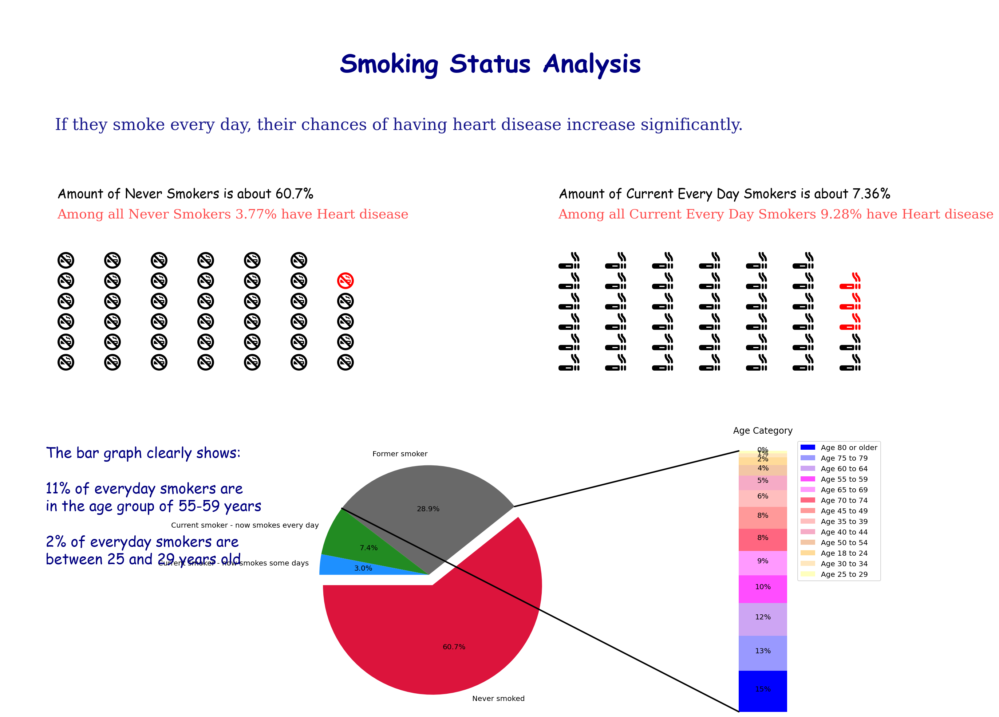

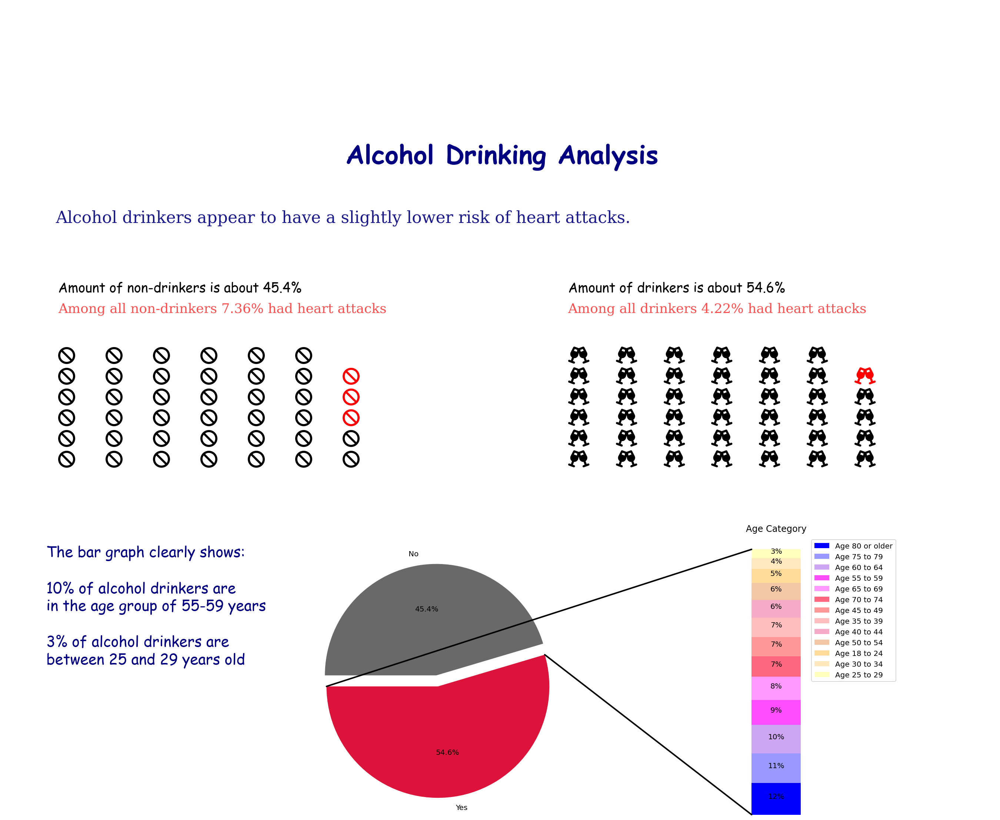

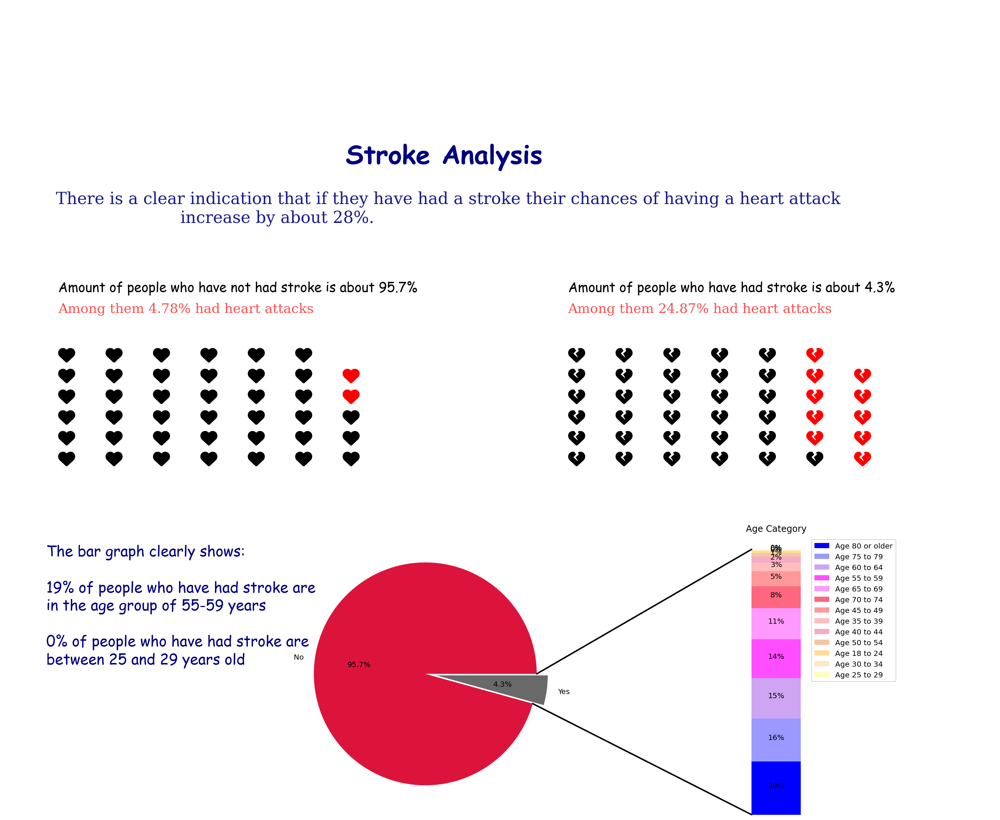

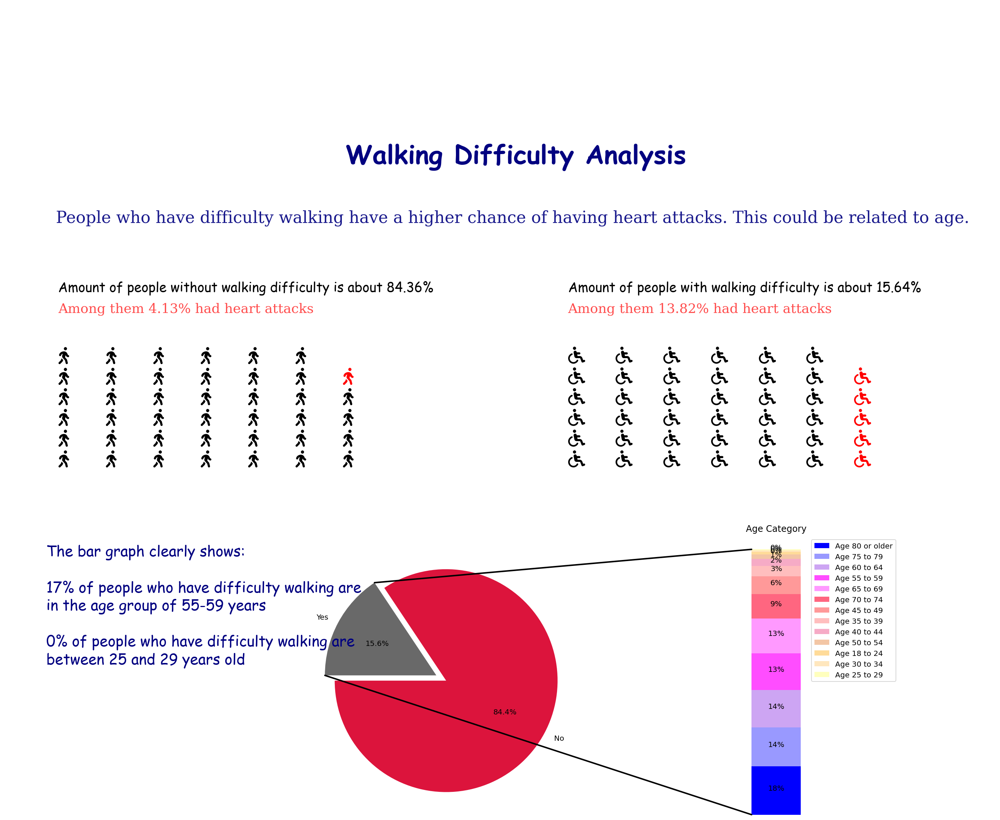

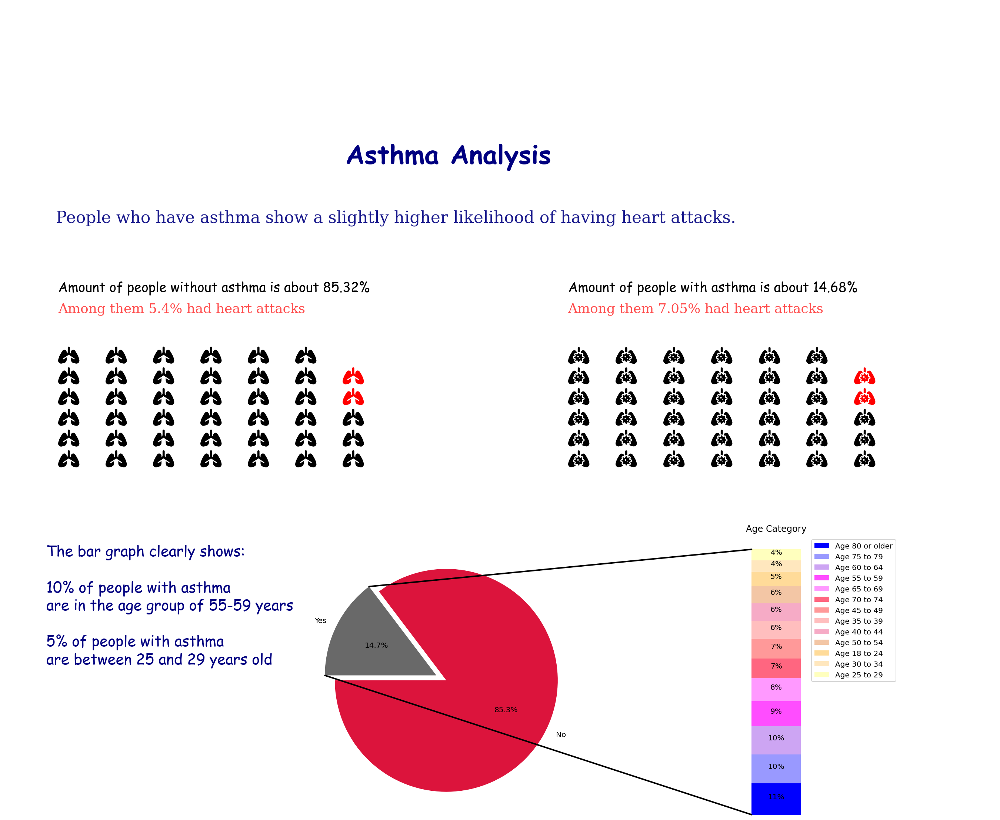

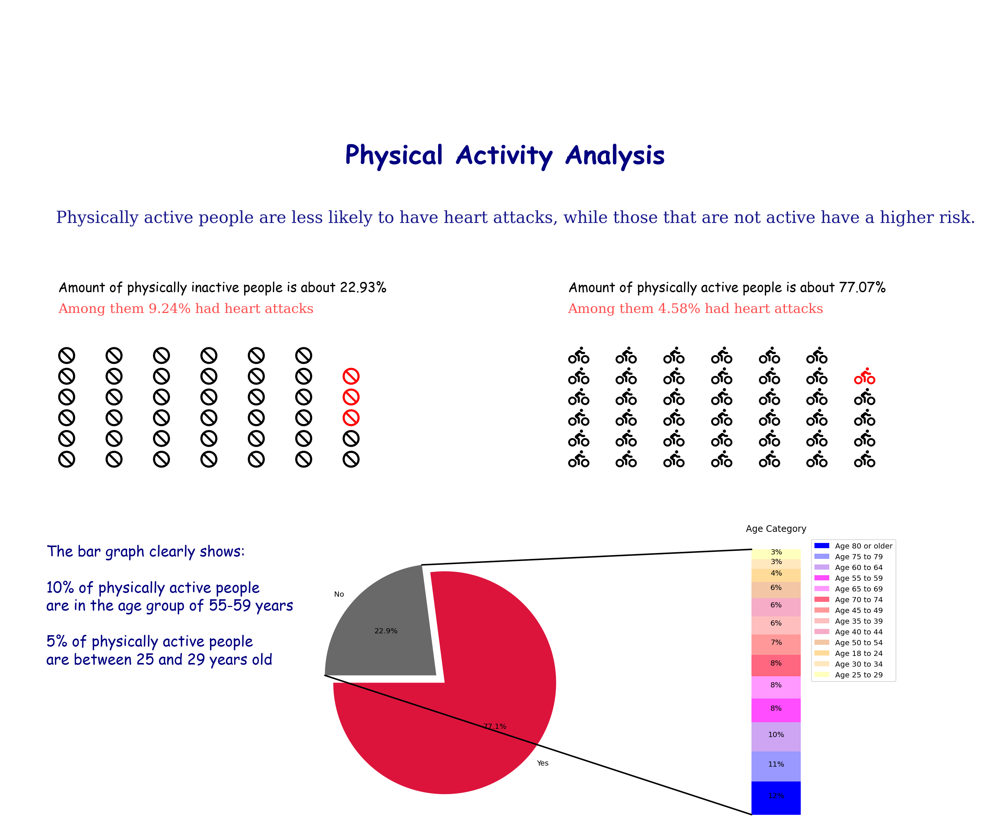

In [8]:
plot_icons()

In [9]:
# Create a copy of the dataframe
dk = df.copy()

# Convert binary values to descriptive labels for each condition
dk.HadStroke = dk.HadStroke.apply(lambda x : 'Had Stroke' if x == 'Yes' else 'No Stroke')
dk.DifficultyWalking = dk.DifficultyWalking.apply(lambda x : 'Has Difficulty Walking' if x == 'Yes' else 'Can Walk Normally')
dk.HadDiabetes = dk.HadDiabetes.apply(lambda x : 'Has Diabetes' if x == 'Yes' else 'No Diabetes')
dk.HadAsthma = dk.HadAsthma.apply(lambda x : 'Has Asthma' if x == 'Yes' else 'No Asthma')
dk.HadKidneyDisease = dk.HadKidneyDisease.apply(lambda x : 'Has Kidney Disease' if x == 'Yes' else 'No Kidney Disease')

# Drop columns that aren't needed for this analysis
dk.drop([
    "BMI",
    "SmokerStatus",
    "AlcoholDrinkers",
    "PhysicalHealthDays",
    "MentalHealthDays", 
    "Sex",
    "AgeCategory",
    "RaceEthnicityCategory",
    "PhysicalActivities",
    "GeneralHealth",
    "HadSkinCancer"
], axis=1, inplace=True)

In [10]:
from itertools import chain, combinations

# Define risk factors with correct column names from your dataset
Risky_patient = [
    "HadStroke",
    "DifficultyWalking",
    "HadDiabetes",
    "HadAsthma",
    "HadKidneyDisease"
]

# Initialize counters
Total_bar = 0
tmp = []

# Generate all possible combinations of risk factors
for i in range(len(Risky_patient)):
    oc = combinations(Risky_patient, i + 1)
    for c in oc:
        tmp.append(list(c))
        Total_bar += 1

# Uncomment to debug
# print(tmp)
# print(Total_bar)

In [11]:
# 2 Factors
dk['St_Dif'] = dk['HadStroke'] + ' & ' + dk['DifficultyWalking']
dk['St_Dia'] = dk['HadStroke'] + ' & ' + dk['HadDiabetes']
dk['St_As'] = dk['HadStroke'] + ' & ' + dk['HadAsthma']
dk['ST_Ki'] = dk['HadStroke'] + ' & ' + dk['HadKidneyDisease']
dk['Dif_Dia'] = dk['DifficultyWalking'] + ' & ' + dk['HadDiabetes']
dk['Dif_As'] = dk['DifficultyWalking'] + ' & ' + dk['HadAsthma']
dk['Dif_Ki'] = dk['DifficultyWalking'] + ' & ' + dk['HadKidneyDisease']
dk['Dia_As'] = dk['HadDiabetes'] + ' & ' + dk['HadAsthma']
dk['Dia_Ki'] = dk['HadDiabetes'] + ' & ' + dk['HadKidneyDisease']
dk['As_Ki'] = dk['HadAsthma'] + ' & ' + dk['HadKidneyDisease']

# 3 Factors
dk['St_Dif_Dia'] = dk['HadStroke'] + ' & ' + dk['DifficultyWalking'] + ' & ' + dk['HadDiabetes']
dk['St_Dif_As'] = dk['HadStroke'] + ' & ' + dk['DifficultyWalking'] + ' & ' + dk['HadAsthma']
dk['St_Dif_Ki'] = dk['HadStroke'] + ' & ' + dk['DifficultyWalking'] + ' & ' + dk['HadKidneyDisease']
dk['ST_Dia_As'] = dk['HadStroke'] + ' & ' + dk['HadDiabetes'] + ' & ' + dk['HadAsthma']
dk['St_Dia_Ki'] = dk['HadStroke'] + ' & ' + dk['HadDiabetes'] + ' & ' + dk['HadKidneyDisease']
dk['St_As_ki'] = dk['HadStroke'] + ' & ' + dk['HadAsthma'] + ' & ' + dk['HadKidneyDisease']
dk['Dif_Dia_As'] = dk['DifficultyWalking'] + ' & ' + dk['HadDiabetes'] + ' & ' + dk['HadAsthma']
dk['Dif_Dia_Ki'] = dk['DifficultyWalking'] + ' & ' + dk['HadDiabetes'] + ' & ' + dk['HadKidneyDisease']
dk['Dif_As_ki'] = dk['DifficultyWalking'] + ' & ' + dk['HadAsthma'] + ' & ' + dk['HadKidneyDisease']
dk['Dia_As_Ki'] = dk['HadDiabetes'] + ' & ' + dk['HadAsthma'] + ' & ' + dk['HadKidneyDisease']

# 4 Factors
dk['St_Dif_Dia_As'] = dk['HadStroke'] + ' & ' + dk['DifficultyWalking'] + ' & ' + dk['HadDiabetes'] + ' & ' + dk['HadAsthma']
dk['St_Dif_Dia_ki'] = dk['HadStroke'] + ' & ' + dk['DifficultyWalking'] + ' & ' + dk['HadDiabetes'] + ' & ' + dk['HadKidneyDisease']
dk['St_Dif_As_ki'] = dk['HadStroke'] + ' & ' + dk['DifficultyWalking'] + ' & ' + dk['HadAsthma'] + ' & ' + dk['HadKidneyDisease']
dk['ST_Dia_As_Ki'] = dk['HadStroke'] + ' & ' + dk['HadDiabetes'] + ' & ' + dk['HadAsthma'] + ' & ' + dk['HadKidneyDisease']
dk['Dif_Dia_As_Ki'] = dk['DifficultyWalking'] + ' & ' + dk['HadDiabetes'] + ' & ' + dk['HadAsthma'] + ' & ' + dk['HadKidneyDisease']

# 5 Factors
dk['St_Dif_Dia_As_Ki'] = dk['HadStroke'] + ' & ' + dk['DifficultyWalking'] + ' & ' + dk['HadDiabetes'] + ' & ' + dk['HadAsthma'] + ' & ' + dk['HadKidneyDisease']

In [12]:
# Create an empty DataFrame to store the risk analysis
df_plot_risky_patient = pd.DataFrame()

# Get list of columns excluding HadHeartAttack (target variable)
list_item = dk.drop("HadHeartAttack", axis=1).columns

# Calculate percentage distribution for each risk factor
for item in list_item:
    
    # Calculate normalized value counts (as percentages) grouped by each risk factor
    df_plot_risky_patient1 = dk.groupby(item)['HadHeartAttack'].value_counts(normalize=True).mul(100)
    df_plot_risky_patient1 = df_plot_risky_patient1.rename('percent').reset_index()
    
    # Concatenate results, renaming the risk factor column to a common name for consistency
    df_plot_risky_patient = pd.concat([
        df_plot_risky_patient,
        df_plot_risky_patient1.rename(columns={item: 'RiskFactor'})
    ], ignore_index=True)

# Filter to show only cases where heart attack occurred (Yes)
df_plot_risky_patient[df_plot_risky_patient["HadHeartAttack"] == "Yes"]

,RiskFactor,HadHeartAttack,percent
1,Alabama,Yes,6.138197
3,Alaska,Yes,5.548303
5,Arizona,Yes,5.779264
7,Arkansas,Yes,7.842529
9,California,Yes,5.196901
...,...,...,...
1667,No Stroke & Has Difficulty Walking & Has Diabe...,Yes,14.508412
1669,No Stroke & Has Difficulty Walking & No Diabet...,Yes,16.261682
1671,No Stroke & Has Difficulty Walking & No Diabet...,Yes,9.164589
1673,No Stroke & Has Difficulty Walking & No Diabet...,Yes,15.138462


In [13]:
# Calculate percentage of heart attacks for each combination of conditions
df_plot_risky_patient_prec = dk.groupby("St_Dif_Dia_As_Ki")['HadHeartAttack'].value_counts(normalize=True).mul(100)
df_plot_risky_patient_prec = df_plot_risky_patient_prec.rename('percent').reset_index()

# Set display options to show full text of combinations
pd.options.display.max_colwidth = 999

# Filter to show only cases where heart attack occurred
df_precent = df_plot_risky_patient_prec[df_plot_risky_patient_prec["HadHeartAttack"]=="Yes"]

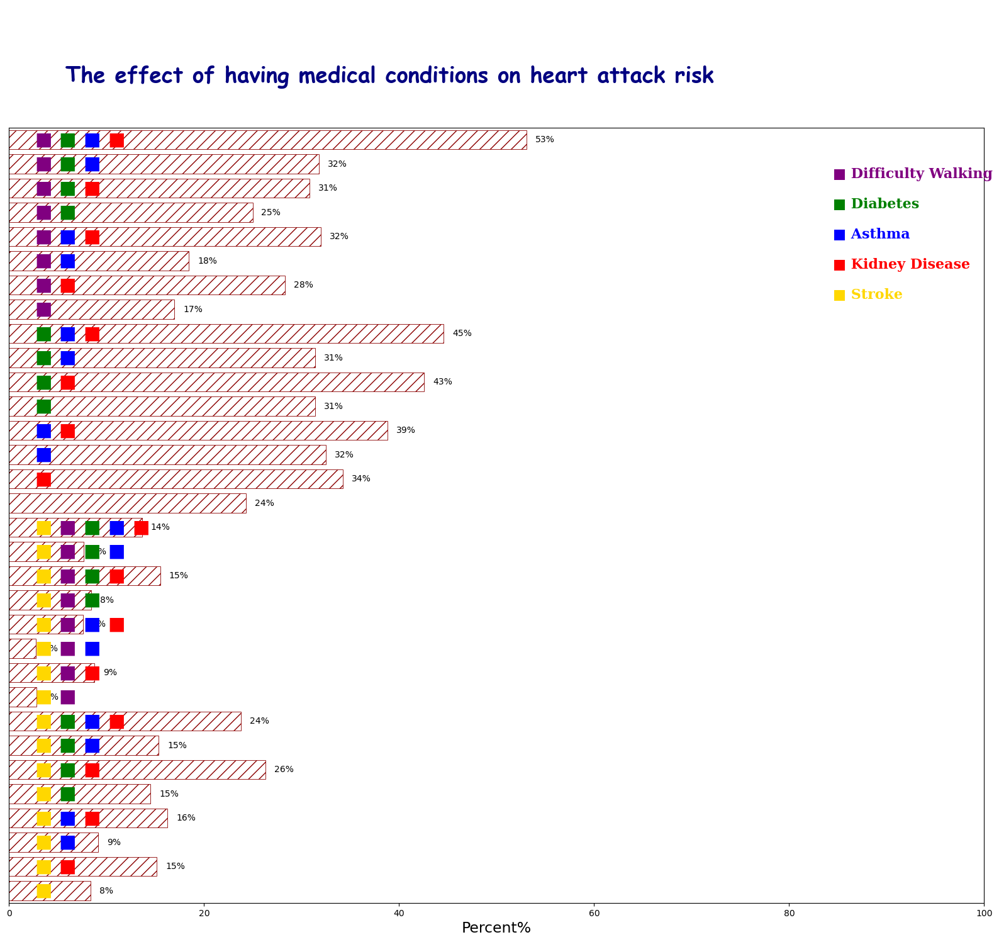

In [14]:
# Create bar plot for risk factor combinations
fig, ax = plt.subplots(1, 1, figsize=(20, 16))
ax = sns.barplot(y=df_precent["St_Dif_Dia_As_Ki"], x=df_precent["percent"], 
                orient='h', color="white", hatch='//', edgecolor="darkred", ecolor="black", linewidth=0.6)

# Add percentage labels
ax.bar_label(ax.containers[0], fmt='%.f%%', padding=10)

# Define colors for each condition
colors = {
    'Had Stroke': 'gold',
    'Has Difficulty Walking': 'purple',
    'Has Diabetes': 'green',
    'Has Asthma': 'blue',
    'Has Kidney Disease': 'red'
}

y = 0

# Define combinations of conditions
axes = [
    ["Has Difficulty Walking", "Has Diabetes", "Has Asthma", "Has Kidney Disease"],
    ["Has Difficulty Walking", "Has Diabetes", "Has Asthma"],
    ["Has Difficulty Walking", "Has Diabetes", "Has Kidney Disease"],
    ["Has Difficulty Walking", "Has Diabetes"],
    ["Has Difficulty Walking", "Has Asthma", "Has Kidney Disease"],
    ["Has Difficulty Walking", "Has Asthma"],
    ["Has Difficulty Walking", "Has Kidney Disease"],
    ["Has Difficulty Walking"],
    ["Has Diabetes", "Has Asthma", "Has Kidney Disease"],
    ["Has Diabetes", "Has Asthma"],
    ["Has Diabetes", "Has Kidney Disease"],
    ["Has Diabetes"],
    ["Has Asthma", "Has Kidney Disease"],
    ["Has Asthma"],
    ["Has Kidney Disease"],
    [],
    ["Had Stroke", "Has Difficulty Walking", "Has Diabetes", "Has Asthma", "Has Kidney Disease"],
    ["Had Stroke", "Has Difficulty Walking", "Has Diabetes", "Has Asthma"],
    ["Had Stroke", "Has Difficulty Walking", "Has Diabetes", "Has Kidney Disease"],
    ["Had Stroke", "Has Difficulty Walking", "Has Diabetes"],
    ["Had Stroke", "Has Difficulty Walking", "Has Asthma", "Has Kidney Disease"],
    ["Had Stroke", "Has Difficulty Walking", "Has Asthma"],
    ["Had Stroke", "Has Difficulty Walking", "Has Kidney Disease"],
    ["Had Stroke", "Has Difficulty Walking"],
    ["Had Stroke", "Has Diabetes", "Has Asthma", "Has Kidney Disease"],
    ["Had Stroke", "Has Diabetes", "Has Asthma"],
    ["Had Stroke", "Has Diabetes", "Has Kidney Disease"],
    ["Had Stroke", "Has Diabetes"],
    ["Had Stroke", "Has Asthma", "Has Kidney Disease"],
    ["Had Stroke", "Has Asthma"],
    ["Had Stroke", "Has Kidney Disease"],
    ["Had Stroke"]
]

# Add condition markers
for axo in axes:
    x = 3.5
    for i in axo:
        ax.annotate('■', ha='center', va='center', fontsize=21, color=colors[i], xy=(x, y), font='Serif')
        x += 2.5
    y += 1

# Set axis labels and limits
ax.set_xlabel('Percent%', size=17)
ax.axes.get_yaxis().set_visible(False)
ax.set(xlim=(0, 100))

# Add legend
fig.text(0.78, 0.83, '■ Difficulty Walking', {'font': 'Serif', 'size': '16', 'weight': 'bold', 'color': colors['Has Difficulty Walking']})
fig.text(0.78, 0.80, '■ Diabetes', {'font': 'Serif', 'size': '16', 'weight': 'bold', 'color': colors['Has Diabetes']})
fig.text(0.78, 0.77, '■ Asthma', {'font': 'Serif', 'size': '16', 'weight': 'bold', 'color': colors['Has Asthma']})
fig.text(0.78, 0.74, '■ Kidney Disease', {'font': 'Serif', 'size': '16', 'weight': 'bold', 'color': colors['Has Kidney Disease']})
fig.text(0.78, 0.71, '■ Stroke', {'font': 'Serif', 'size': '16', 'weight': 'bold', 'color': colors['Had Stroke']})

# Add title
fig.text(0.17, 0.925, 'The effect of having medical conditions on heart attack risk', 
         {'font': 'cursive', 'weight': 'bold', 'color': 'Navy', 'size': 25})
fig.text(0.20, 0.99, ' ', {'font': 'Serif', 'size': '16', 'color': 'black'})

plt.show()

In [15]:
# Create a copy of the dataframe for analysis
dk_a = df.copy()

# Convert binary values to descriptive labels for lifestyle factors
dk_a.SmokerStatus = dk_a.SmokerStatus.apply(lambda x : 'Current smoker' if x == 'Current smoker - now smokes every day' 
                                           else 'Non smoker' if x == 'Never smoked' 
                                           else 'Former smoker')
dk_a.AlcoholDrinkers = dk_a.AlcoholDrinkers.apply(lambda x : 'Drinks Alcohol' if x == 'Yes' else 'Does Not Drink')
dk_a.PhysicalActivities = dk_a.PhysicalActivities.apply(lambda x : 'Physically Active' if x == 'Yes' else 'Not Active')

# Drop columns not needed for this lifestyle analysis
dk_a.drop([
    "BMI",
    "HadStroke",
    "DifficultyWalking",
    "HadDiabetes",
    "MentalHealthDays",
    "PhysicalHealthDays",
    "Sex",
    "AgeCategory",
    "RaceEthnicityCategory",
    "HadAsthma",
    "GeneralHealth",
    "HadSkinCancer",
    "HadKidneyDisease"
], axis=1, inplace=True)

In [16]:
# 2 Factor combinations
dk_a['Sm_Al'] = dk_a['SmokerStatus'] + ' & ' + dk_a['AlcoholDrinkers']
dk_a['Sm_Ph'] = dk_a['SmokerStatus'] + ' & ' + dk_a['PhysicalActivities']
dk_a['Al_Ph'] = dk_a['AlcoholDrinkers'] + ' & ' + dk_a['PhysicalActivities']

# 3 Factor combination
dk_a['Sm_Al_Ph'] = dk_a['SmokerStatus'] + ' & ' + dk_a['AlcoholDrinkers'] + ' & ' + dk_a['PhysicalActivities']

In [17]:
# Calculate percentage of heart attacks for each lifestyle factor combination
df_plot_risky_Activity_prec = dk_a.groupby("Sm_Al_Ph")['HadHeartAttack'].value_counts(normalize=True).mul(100)
df_plot_risky_Activity_prec = df_plot_risky_Activity_prec.rename('percent').reset_index()

# Set display options to show full text
pd.options.display.max_colwidth = 999

# Filter to show only cases where heart attack occurred
df_A_precent = df_plot_risky_Activity_prec[df_plot_risky_Activity_prec["HadHeartAttack"]=="Yes"]

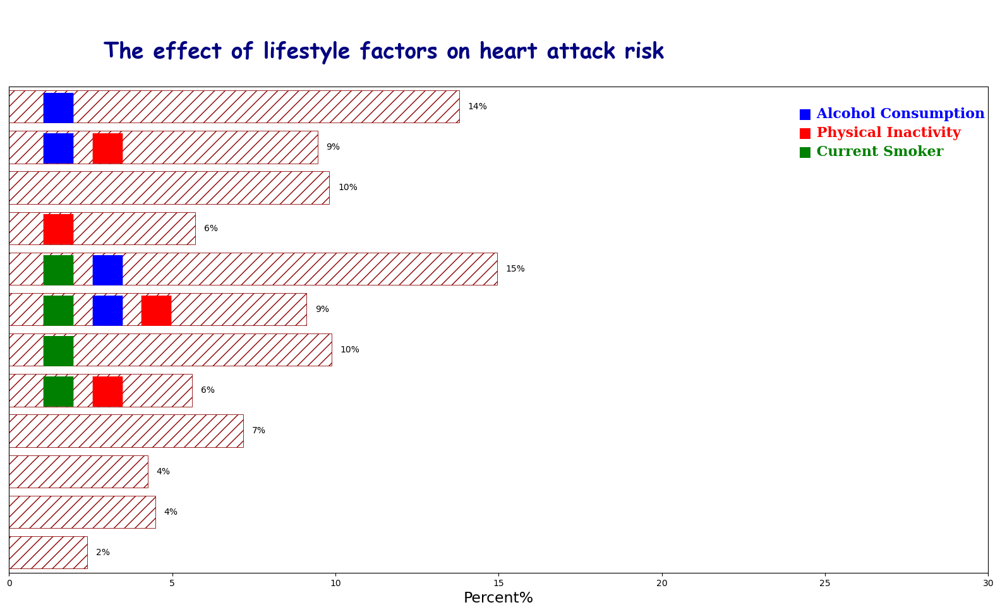

In [18]:
# Create visualization for lifestyle factors and heart attack risk
fig, ax = plt.subplots(1, 1, figsize=(20, 10))
ax = sns.barplot(y=df_A_precent["Sm_Al_Ph"], x=df_A_precent["percent"], 
                orient='h', color="white", hatch='//', edgecolor="darkred", ecolor="black", linewidth=0.6)

# Add percentage labels
ax.bar_label(ax.containers[0], fmt='%.f%%', padding=10)

# Define colors for lifestyle factors
colors = {
    'Drinks Alcohol': 'Blue',
    'Not Active': 'red',
    'Current smoker': 'green'
}

y = 0

# Define combinations of lifestyle factors
axes = [
    ["Drinks Alcohol"],
    ["Drinks Alcohol", "Not Active"],
    [],
    ["Not Active"],
    ["Current smoker", "Drinks Alcohol"],
    ["Current smoker", "Drinks Alcohol", "Not Active"],
    ["Current smoker"],
    ["Current smoker", "Not Active"]
]

# Add lifestyle factor markers
for axo in axes:
    x = 1.5
    for i in axo:
        ax.annotate('■', ha='center', va='center', fontsize=45, color=colors[i], xy=(x, y), font='Serif')
        x += 1.5
    y += 1

# Set axis labels and limits
ax.set_xlabel('Percent%', size=17)
ax.axes.get_yaxis().set_visible(False)
ax.set(xlim=(0, 30))

# Add legend
fig.text(0.75, 0.83, '■ Alcohol Consumption', 
         {'font': 'Serif', 'size': '16', 'weight': 'bold', 'color': colors['Drinks Alcohol']})
fig.text(0.75, 0.80, '■ Physical Inactivity', 
         {'font': 'Serif', 'size': '16', 'weight': 'bold', 'color': colors['Not Active']})
fig.text(0.75, 0.77, '■ Current Smoker', 
         {'font': 'Serif', 'size': '16', 'weight': 'bold', 'color': colors['Current smoker']})

# Add title
fig.text(0.20, 0.925, 'The effect of lifestyle factors on heart attack risk',
         {'font': 'cursive', 'weight': 'bold', 'color': 'Navy', 'size': 25})
fig.text(0.20, 0.99, ' ', {'font': 'Serif', 'size': '16', 'color': 'black'})

plt.show()

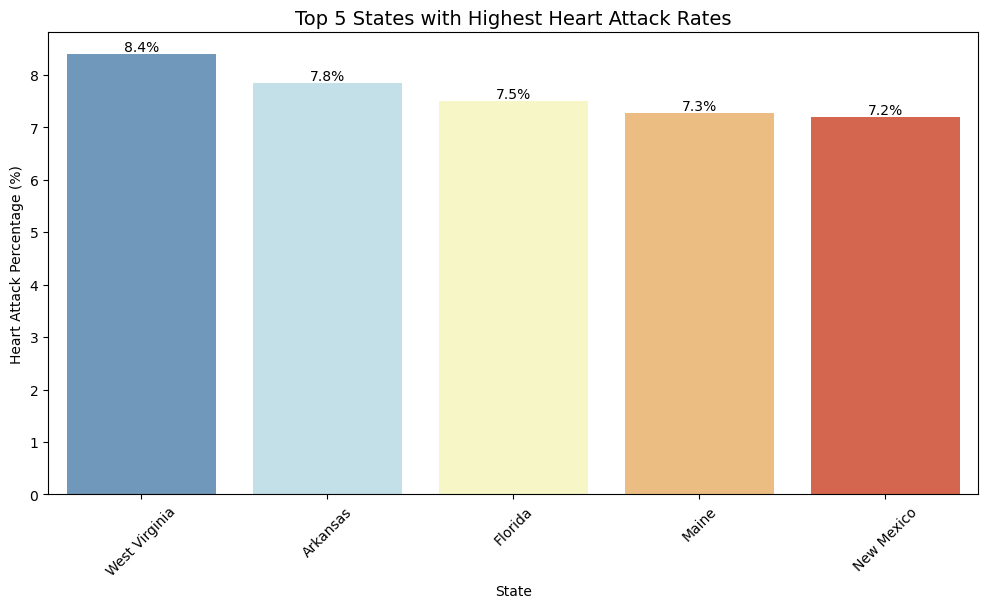

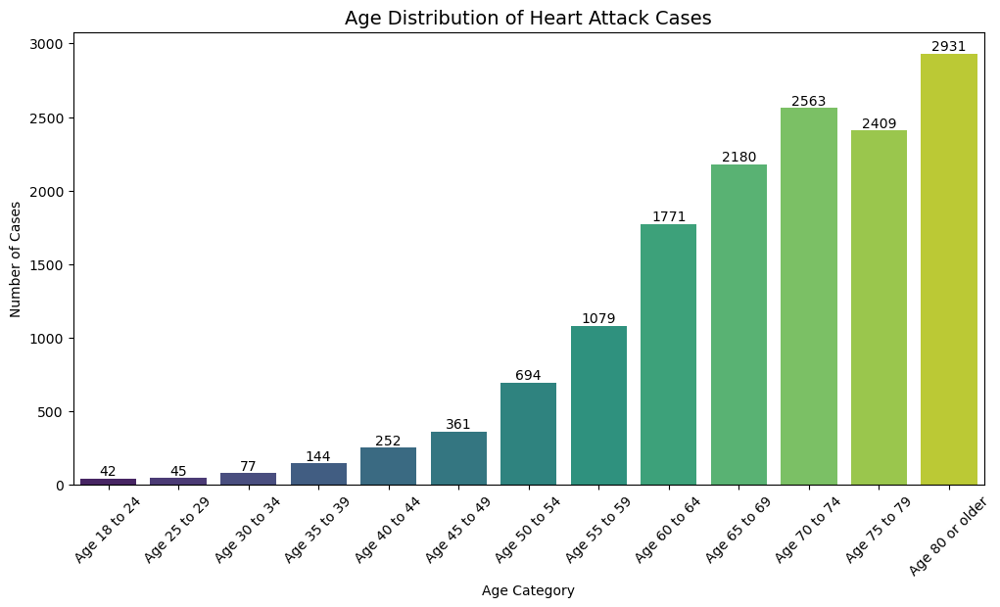

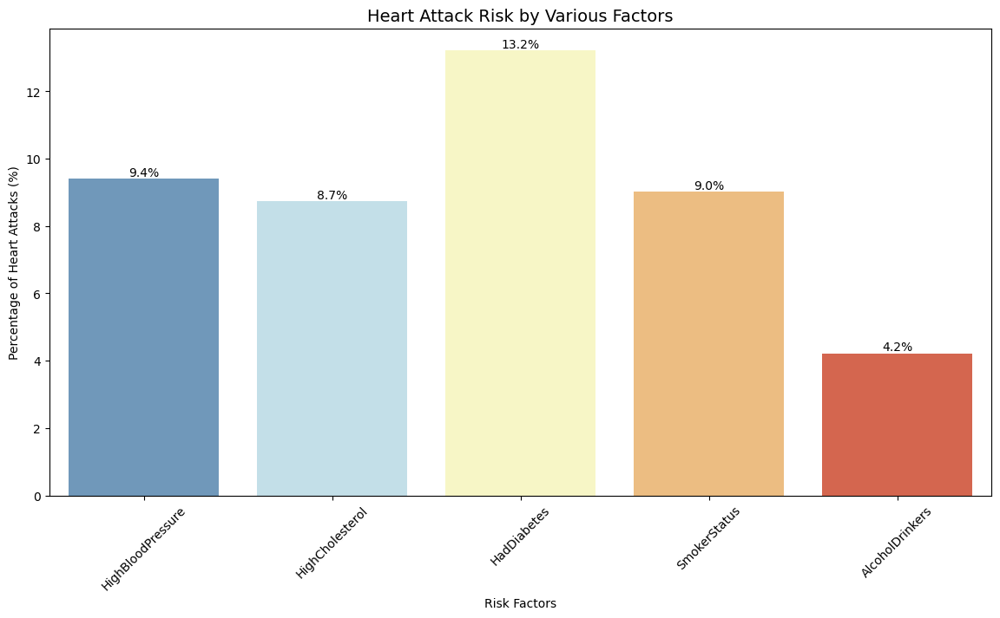

<Figure size 1400x600 with 0 Axes>

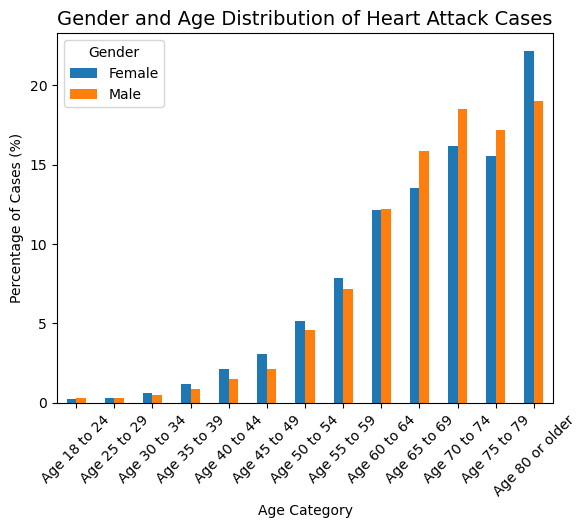

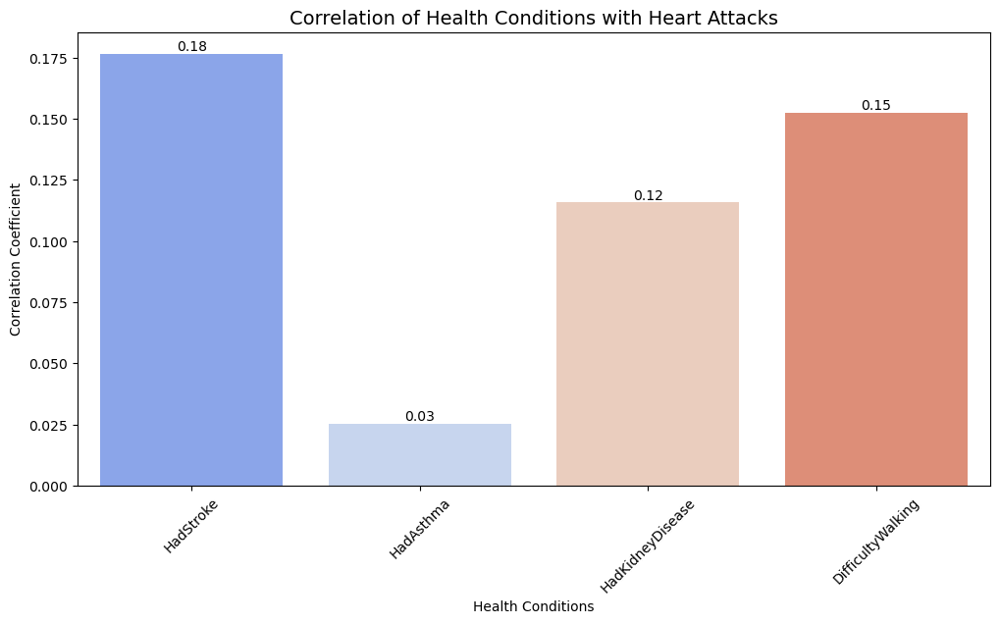

In [19]:
# 1. Top 5 States with Highest Heart Attack Rates
plt.figure(figsize=(12,6))
state_heart_attack = df.groupby('State')['HadHeartAttack'].apply(lambda x: (x=='Yes').mean()*100).sort_values(ascending=False).head()

sns.barplot(x=state_heart_attack.index, y=state_heart_attack.values, palette='RdYlBu_r')
plt.title('Top 5 States with Highest Heart Attack Rates', fontsize=14)
plt.xlabel('State')
plt.ylabel('Heart Attack Percentage (%)')
plt.xticks(rotation=45)
for i, v in enumerate(state_heart_attack.values):
    plt.text(i, v, f'{v:.1f}%', ha='center', va='bottom')
plt.show()

# 2. Age Distribution of Heart Attack Cases
plt.figure(figsize=(12,6))
age_heart = df[df['HadHeartAttack']=='Yes']['AgeCategory'].value_counts().sort_index()
sns.barplot(x=age_heart.index, y=age_heart.values, palette='viridis')
plt.title('Age Distribution of Heart Attack Cases', fontsize=14)
plt.xlabel('Age Category')
plt.ylabel('Number of Cases')
plt.xticks(rotation=45)
for i, v in enumerate(age_heart.values):
    plt.text(i, v, str(v), ha='center', va='bottom')
plt.show()

# 3. Heart Attack Risk Factors Analysis
plt.figure(figsize=(14,7))
risk_factors = ['HighBloodPressure', 'HighCholesterol', 'HadDiabetes', 'SmokerStatus', 'AlcoholDrinkers']
risk_percentages = []

for factor in risk_factors:
    if factor == 'SmokerStatus':
        risk_pct = df[df['SmokerStatus'].str.contains('Current smoker')]['HadHeartAttack'].value_counts(normalize=True)['Yes'] * 100
    else:
        risk_pct = df[df[factor]=='Yes']['HadHeartAttack'].value_counts(normalize=True)['Yes'] * 100
    risk_percentages.append(risk_pct)

sns.barplot(x=risk_factors, y=risk_percentages, palette='RdYlBu_r')
plt.title('Heart Attack Risk by Various Factors', fontsize=14)
plt.xlabel('Risk Factors')
plt.ylabel('Percentage of Heart Attacks (%)')
plt.xticks(rotation=45)
for i, v in enumerate(risk_percentages):
    plt.text(i, v, f'{v:.1f}%', ha='center', va='bottom')
plt.show()

# 4. Gender and Age Distribution of Heart Attacks
plt.figure(figsize=(14,6))
gender_age_heart = pd.crosstab(df[df['HadHeartAttack']=='Yes']['AgeCategory'], 
                              df[df['HadHeartAttack']=='Yes']['Sex'], 
                              normalize='columns')*100

gender_age_heart.plot(kind='bar', stacked=False)
plt.title('Gender and Age Distribution of Heart Attack Cases', fontsize=14)
plt.xlabel('Age Category')
plt.ylabel('Percentage of Cases (%)')
plt.legend(title='Gender')
plt.xticks(rotation=45)
plt.show()

# 5. Health Conditions Correlation with Heart Attacks
health_conditions = ['HadStroke', 'HadAsthma', 'HadKidneyDisease', 'DifficultyWalking']
plt.figure(figsize=(12,6))
correlation_values = []

for condition in health_conditions:
    corr = df[condition].map({'Yes': 1, 'No': 0}).corr(df['HadHeartAttack'].map({'Yes': 1, 'No': 0}))
    correlation_values.append(corr)

sns.barplot(x=health_conditions, y=correlation_values, palette='coolwarm')
plt.title('Correlation of Health Conditions with Heart Attacks', fontsize=14)
plt.xlabel('Health Conditions')
plt.ylabel('Correlation Coefficient')
plt.xticks(rotation=45)
for i, v in enumerate(correlation_values):
    plt.text(i, v, f'{v:.2f}', ha='center', va='bottom')
plt.show()

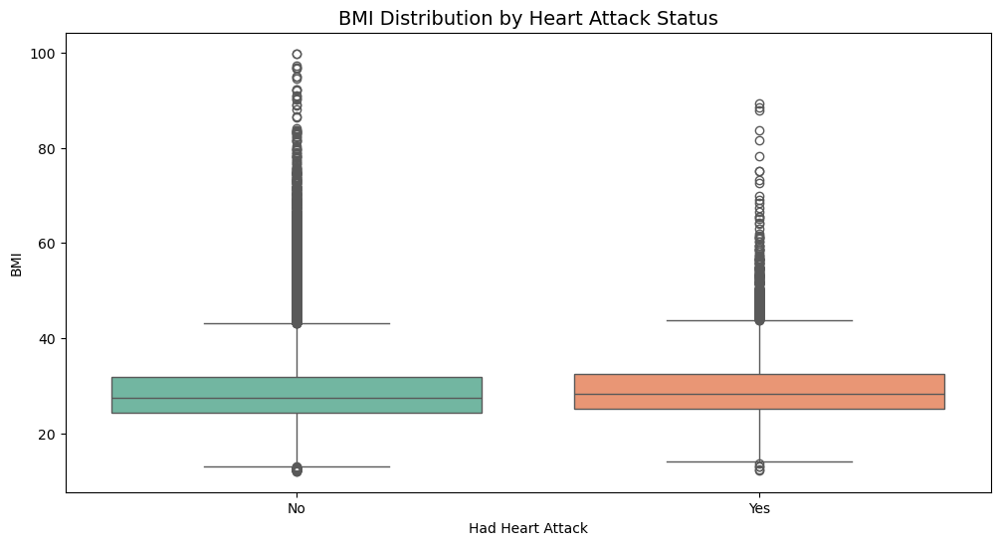

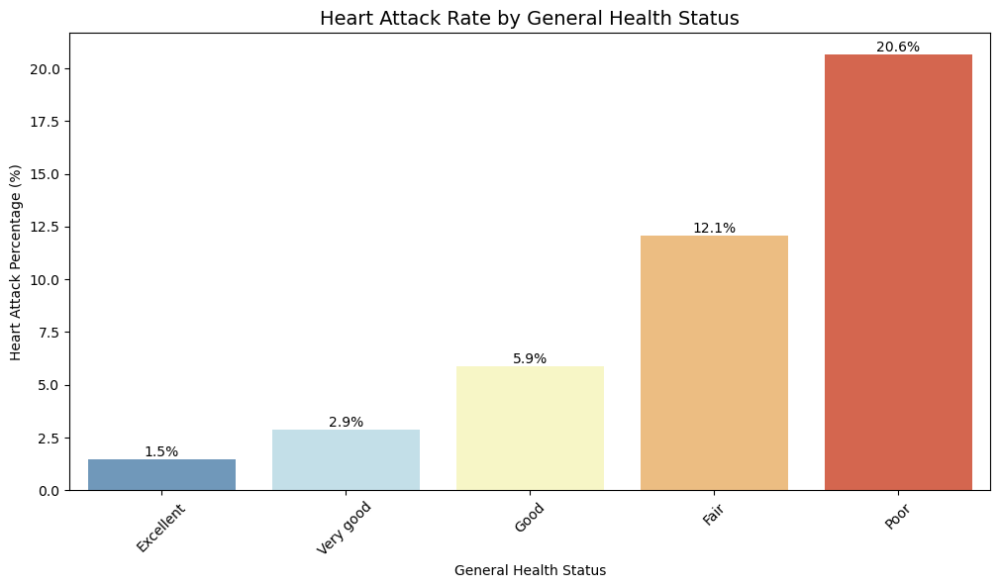

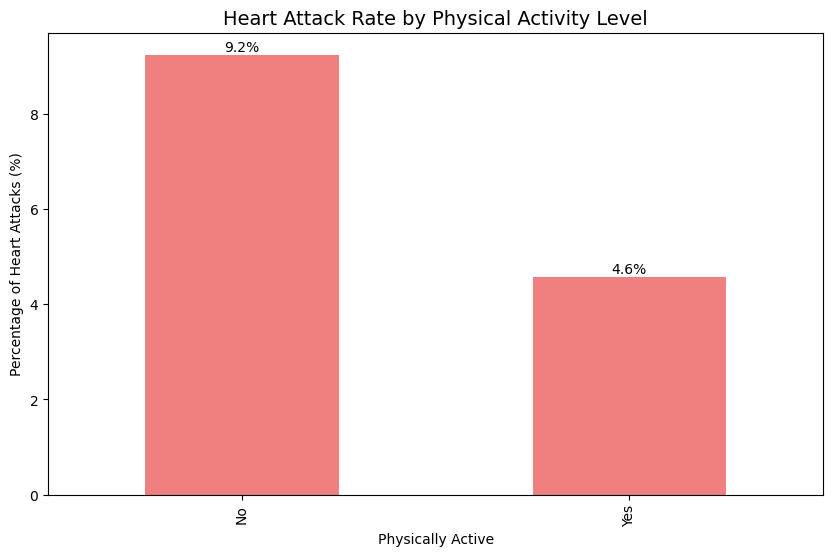

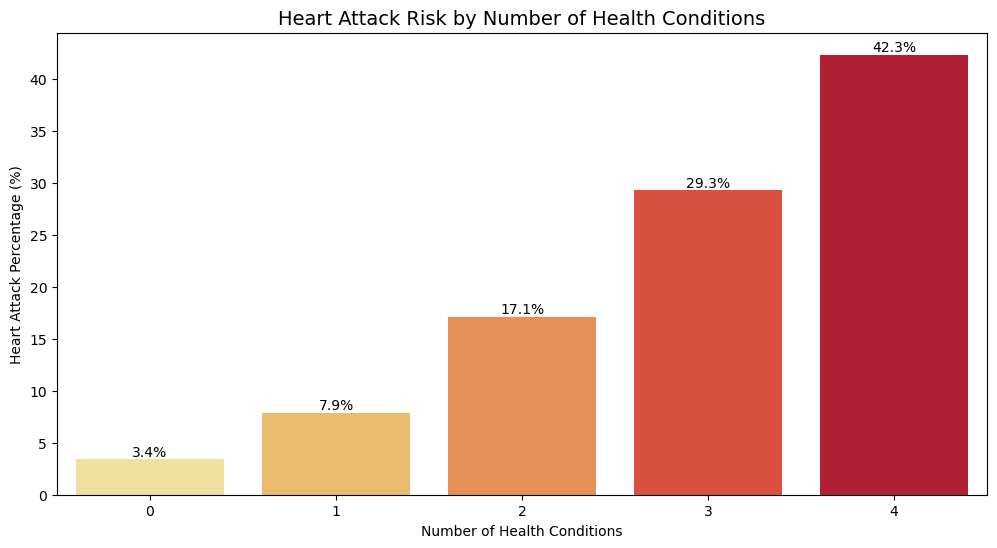

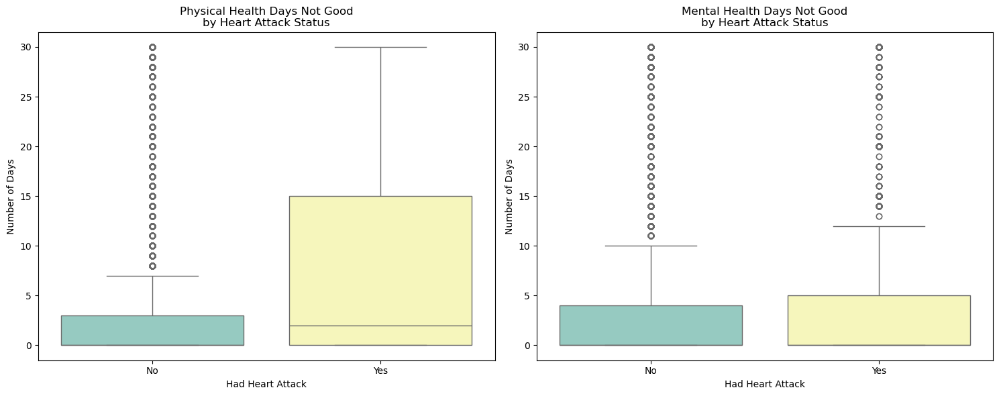

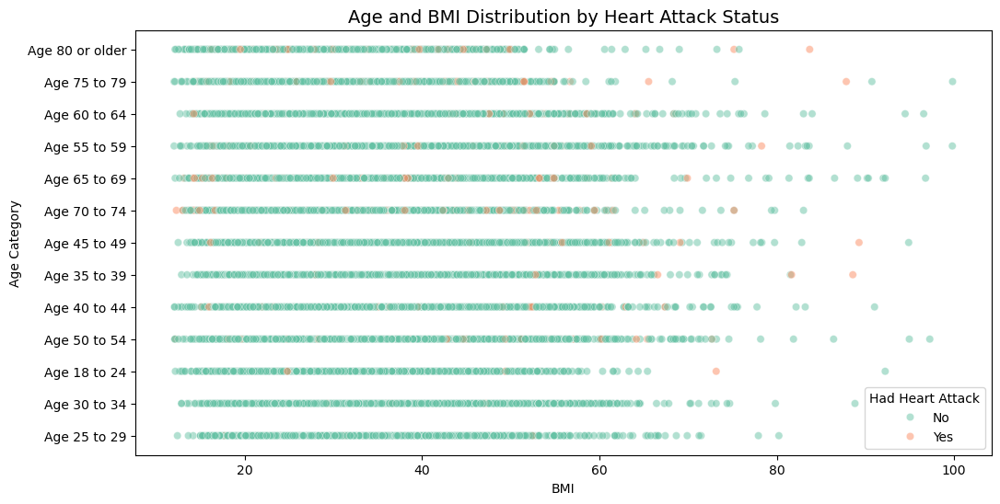

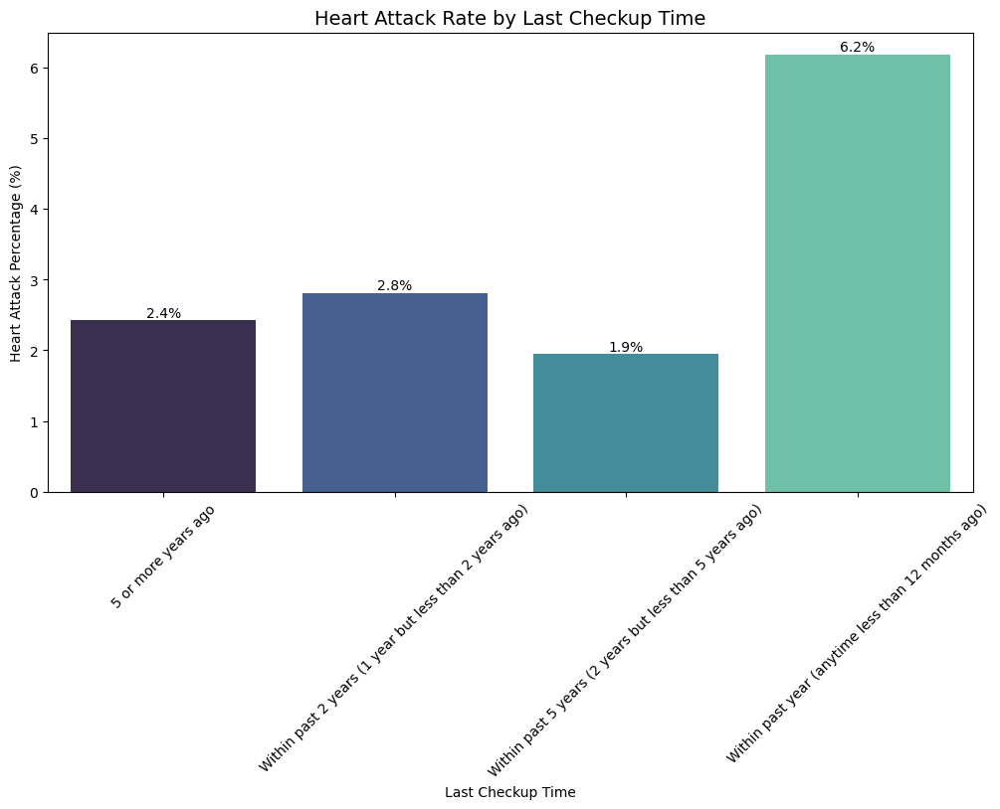

In [20]:
# 6. BMI Distribution by Heart Attack Status
plt.figure(figsize=(12,6))
sns.boxplot(x='HadHeartAttack', y='BMI', data=df, palette='Set2')
plt.title('BMI Distribution by Heart Attack Status', fontsize=14)
plt.xlabel('Had Heart Attack')
plt.ylabel('BMI')
plt.show()

# 7. General Health Status vs Heart Attack Rate
plt.figure(figsize=(12,6))
health_heart = df.groupby('GeneralHealth')['HadHeartAttack'].apply(lambda x: (x=='Yes').mean()*100).sort_values()
sns.barplot(x=health_heart.index, y=health_heart.values, palette='RdYlBu_r')
plt.title('Heart Attack Rate by General Health Status', fontsize=14)
plt.xlabel('General Health Status')
plt.ylabel('Heart Attack Percentage (%)')
plt.xticks(rotation=45)
for i, v in enumerate(health_heart.values):
    plt.text(i, v, f'{v:.1f}%', ha='center', va='bottom')
plt.show()

# 8. Physical Activity Impact on Heart Attack
plt.figure(figsize=(10,6))
activity_heart = df.groupby(['PhysicalActivities', 'HadHeartAttack']).size().unstack()
activity_pct = activity_heart.div(activity_heart.sum(axis=1), axis=0) * 100

activity_pct['Yes'].plot(kind='bar', color='lightcoral')
plt.title('Heart Attack Rate by Physical Activity Level', fontsize=14)
plt.xlabel('Physically Active')
plt.ylabel('Percentage of Heart Attacks (%)')
for i, v in enumerate(activity_pct['Yes']):
    plt.text(i, v, f'{v:.1f}%', ha='center', va='bottom')
plt.show()

# 9. Multiple Health Conditions Analysis
plt.figure(figsize=(12,6))
df['ConditionCount'] = df[health_conditions].apply(lambda x: (x == 'Yes').sum(), axis=1)
condition_heart = df.groupby('ConditionCount')['HadHeartAttack'].apply(lambda x: (x=='Yes').mean()*100)

sns.barplot(x=condition_heart.index, y=condition_heart.values, palette='YlOrRd')
plt.title('Heart Attack Risk by Number of Health Conditions', fontsize=14)
plt.xlabel('Number of Health Conditions')
plt.ylabel('Heart Attack Percentage (%)')
for i, v in enumerate(condition_heart.values):
    plt.text(i, v, f'{v:.1f}%', ha='center', va='bottom')
plt.show()

# 10. Mental and Physical Health Days Impact
plt.figure(figsize=(15,6))
plt.subplot(1,2,1)
sns.boxplot(x='HadHeartAttack', y='PhysicalHealthDays', data=df, palette='Set3')
plt.title('Physical Health Days Not Good\nby Heart Attack Status', fontsize=12)
plt.xlabel('Had Heart Attack')
plt.ylabel('Number of Days')

plt.subplot(1,2,2)
sns.boxplot(x='HadHeartAttack', y='MentalHealthDays', data=df, palette='Set3')
plt.title('Mental Health Days Not Good\nby Heart Attack Status', fontsize=12)
plt.xlabel('Had Heart Attack')
plt.ylabel('Number of Days')
plt.tight_layout()
plt.show()

# 11. Age and BMI Relationship with Heart Attacks
plt.figure(figsize=(12,6))
sns.scatterplot(data=df, x='BMI', y='AgeCategory', hue='HadHeartAttack', 
                alpha=0.5, palette='Set2')
plt.title('Age and BMI Distribution by Heart Attack Status', fontsize=14)
plt.xlabel('BMI')
plt.ylabel('Age Category')
plt.legend(title='Had Heart Attack')
plt.show()

# 12. Last Checkup Time vs Heart Attack Risk
plt.figure(figsize=(12,6))
checkup_heart = df.groupby('LastCheckupTime')['HadHeartAttack'].apply(lambda x: (x=='Yes').mean()*100)
sns.barplot(x=checkup_heart.index, y=checkup_heart.values, palette='mako')
plt.title('Heart Attack Rate by Last Checkup Time', fontsize=14)
plt.xlabel('Last Checkup Time')
plt.ylabel('Heart Attack Percentage (%)')
plt.xticks(rotation=45)
for i, v in enumerate(checkup_heart.values):
    plt.text(i, v, f'{v:.1f}%', ha='center', va='bottom')
plt.show()

In [21]:
# # 1. Heart Attack Risk by Age and Gender with Health Status
# plt.figure(figsize=(15, 7))
# g = sns.catplot(data=df, x='AgeCategory', y='GeneralHealth', 
#                 hue='HadHeartAttack', col='Sex',
#                 kind='swarm', height=6, aspect=1.5, palette='viridis')
# g.fig.suptitle('Heart Attack Distribution by Age, Gender and Health Status', y=1.05, fontsize=14)
# plt.xticks(rotation=45)
# plt.tight_layout()
# plt.show()

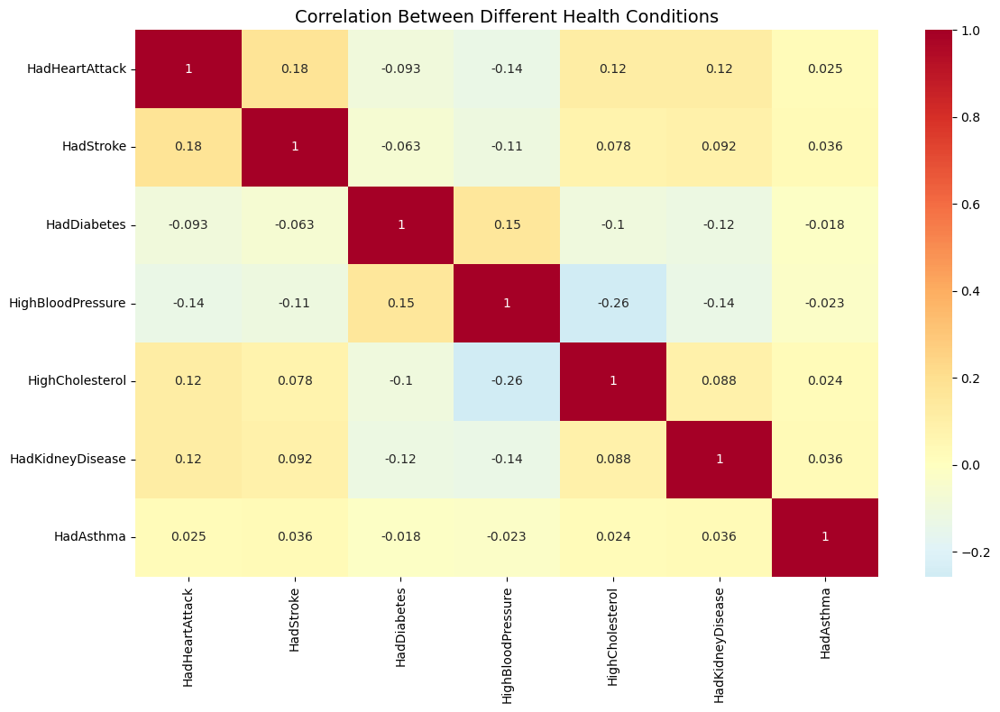

In [22]:
# 2. Combined Risk Factors Heatmap
risk_columns = ['HadHeartAttack', 'HadStroke', 'HadDiabetes', 'HighBloodPressure', 
                'HighCholesterol', 'HadKidneyDisease', 'HadAsthma']
plt.figure(figsize=(12, 8))
sns.heatmap(df[risk_columns].apply(lambda x: pd.factorize(x)[0]).corr(), 
            annot=True, cmap='RdYlBu_r', center=0)
plt.title('Correlation Between Different Health Conditions', fontsize=14)
plt.tight_layout()
plt.show()


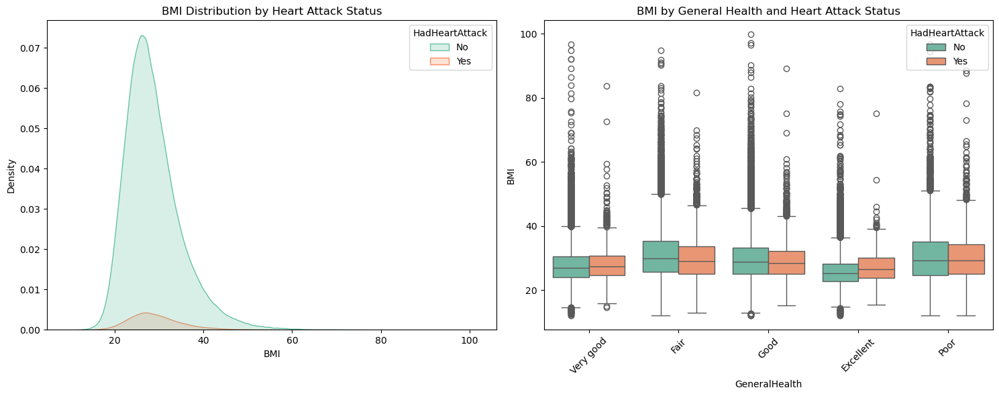

In [23]:
# 3. BMI Distribution Analysis
plt.figure(figsize=(15, 6))
plt.subplot(1, 2, 1)
sns.kdeplot(data=df, x='BMI', hue='HadHeartAttack', fill=True, palette='Set2')
plt.title('BMI Distribution by Heart Attack Status')

plt.subplot(1, 2, 2)
sns.boxplot(data=df, x='GeneralHealth', y='BMI', hue='HadHeartAttack', palette='Set2')
plt.xticks(rotation=45)
plt.title('BMI by General Health and Heart Attack Status')
plt.tight_layout()
plt.show()

<Figure size 1200x600 with 0 Axes>

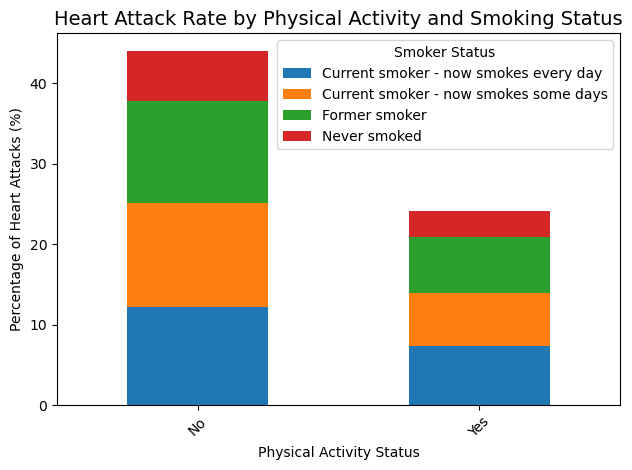

In [24]:
# 4. Lifestyle Impact Analysis
plt.figure(figsize=(12, 6))
lifestyle = pd.crosstab([df['PhysicalActivities'], df['SmokerStatus']], 
                       df['HadHeartAttack'], normalize='index') * 100
lifestyle['Yes'].unstack().plot(kind='bar', stacked=True)
plt.title('Heart Attack Rate by Physical Activity and Smoking Status', fontsize=14)
plt.xlabel('Physical Activity Status')
plt.ylabel('Percentage of Heart Attacks (%)')
plt.legend(title='Smoker Status')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [ ]:
# # 5. Multi-factor Risk Analysis
# plt.figure(figsize=(12, 6))
# risk_score = df[['HighBloodPressure', 'HighCholesterol', 'HadDiabetes']].apply(
#     lambda x: (x == 'Yes').sum(), axis=1)
# risk_analysis = df.groupby(risk_score)['HadHeartAttack'].apply(
#     lambda x: (x == 'Yes').mean() * 100).reset_index()
# sns.barplot(data=risk_analysis, x='risk_score', y='HadHeartAttack', palette='YlOrRd')
# plt.title('Heart Attack Risk by Number of Major Risk Factors\n(High BP, High Cholesterol, Diabetes)', 
#          fontsize=14)
# plt.xlabel('Number of Risk Factors Present')
# plt.ylabel('Heart Attack Percentage (%)')
# for i, v in enumerate(risk_analysis['HadHeartAttack']):
#     plt.text(i, v, f'{v:.1f}%', ha='center', va='bottom')
# plt.show()

ValueError: Could not interpret value `risk_score` for `x`. An entry with this name does not appear in `data`.

<Figure size 1200x600 with 0 Axes>

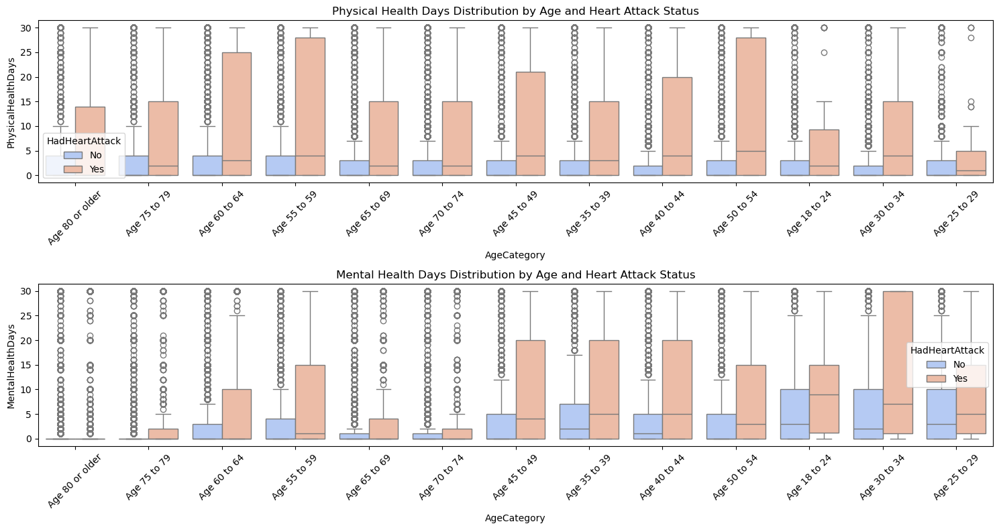

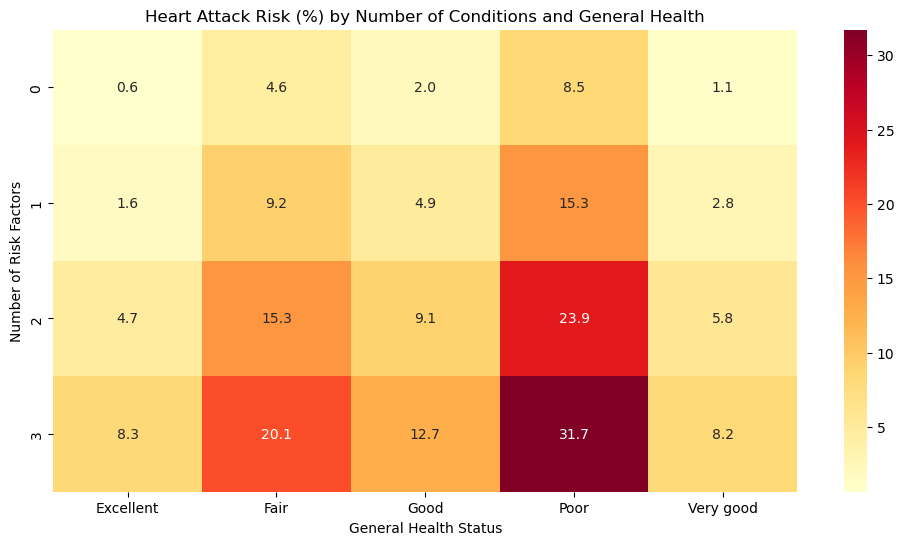

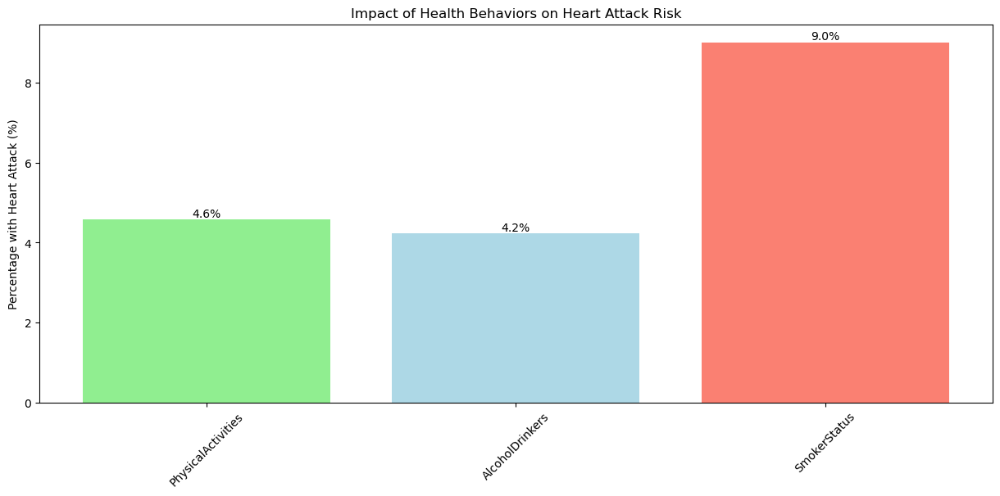

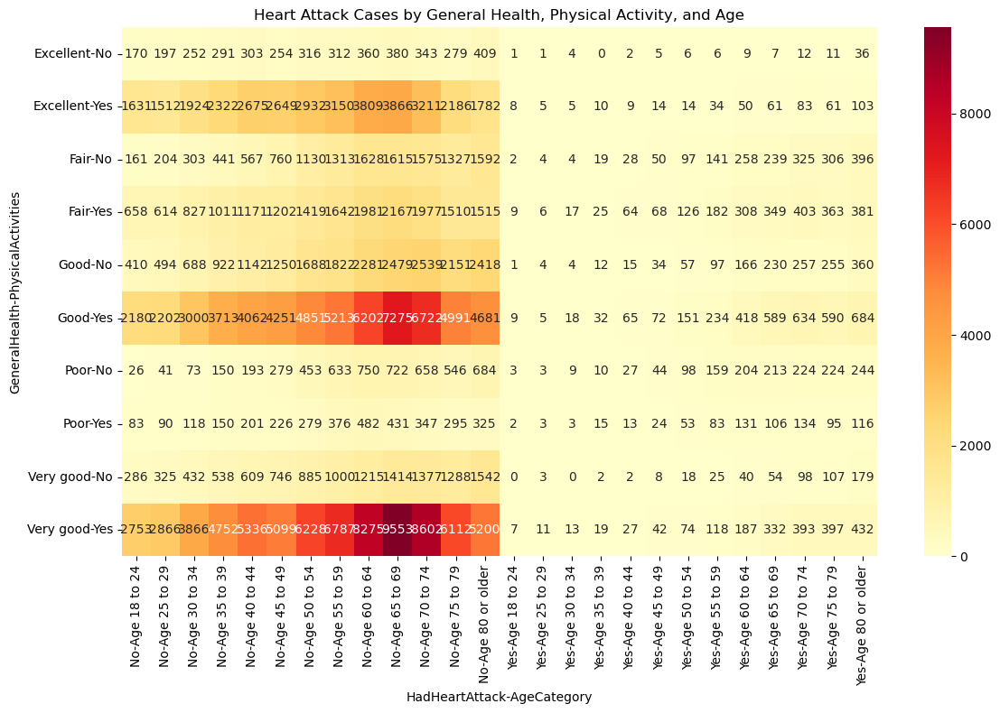

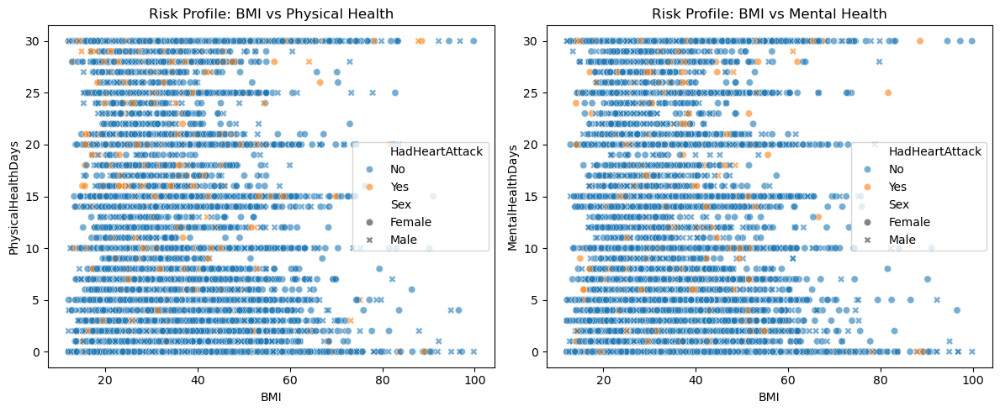

In [27]:
# 1. Time Series Analysis of Health Metrics
plt.figure(figsize=(15, 8))
plt.subplot(2,1,1)
sns.boxplot(data=df, x='AgeCategory', y='PhysicalHealthDays', hue='HadHeartAttack', palette='coolwarm')
plt.title('Physical Health Days Distribution by Age and Heart Attack Status')
plt.xticks(rotation=45)

plt.subplot(2,1,2)
sns.boxplot(data=df, x='AgeCategory', y='MentalHealthDays', hue='HadHeartAttack', palette='coolwarm')
plt.title('Mental Health Days Distribution by Age and Heart Attack Status')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# 2. Risk Factor Combinations Impact
plt.figure(figsize=(12, 6))
conditions = ['HighBloodPressure', 'HadDiabetes', 'HighCholesterol']
df['RiskCount'] = df[conditions].apply(lambda x: (x == 'Yes').sum(), axis=1)
risk_impact = df.groupby(['RiskCount', 'GeneralHealth'])['HadHeartAttack'].apply(
    lambda x: (x == 'Yes').mean() * 100).unstack()

sns.heatmap(risk_impact, annot=True, fmt='.1f', cmap='YlOrRd')
plt.title('Heart Attack Risk (%) by Number of Conditions and General Health')
plt.xlabel('General Health Status')
plt.ylabel('Number of Risk Factors')
plt.show()

# 3. Health Behavior Patterns
plt.figure(figsize=(15, 6))
behavior_cols = ['PhysicalActivities', 'AlcoholDrinkers', 'SmokerStatus']
behavior_impacts = []

for col in behavior_cols:
    if col == 'SmokerStatus':
        impact = df[df[col].str.contains('Current', na=False)]['HadHeartAttack'].value_counts(normalize=True)['Yes'] * 100
    else:
        impact = df[df[col] == 'Yes']['HadHeartAttack'].value_counts(normalize=True)['Yes'] * 100
    behavior_impacts.append(impact)

plt.bar(behavior_cols, behavior_impacts, color=['lightgreen', 'lightblue', 'salmon'])
plt.title('Impact of Health Behaviors on Heart Attack Risk')
plt.ylabel('Percentage with Heart Attack (%)')
plt.xticks(rotation=45)
for i, v in enumerate(behavior_impacts):
    plt.text(i, v, f'{v:.1f}%', ha='center', va='bottom')
plt.show()

# 4. Combined Health Status Analysis
plt.figure(figsize=(12, 8))
health_matrix = pd.crosstab([df['GeneralHealth'], df['PhysicalActivities']], 
                           [df['HadHeartAttack'], df['AgeCategory']])
sns.heatmap(health_matrix, cmap='YlOrRd', annot=True, fmt='d')
plt.title('Heart Attack Cases by General Health, Physical Activity, and Age')
plt.tight_layout()
plt.show()

# 5. Risk Profile Clustering
from sklearn.preprocessing import StandardScaler

numeric_cols = ['BMI', 'PhysicalHealthDays', 'MentalHealthDays']
X = StandardScaler().fit_transform(df[numeric_cols])

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
sns.scatterplot(data=df, x='BMI', y='PhysicalHealthDays', 
                hue='HadHeartAttack', style='Sex', alpha=0.6)
plt.title('Risk Profile: BMI vs Physical Health')

plt.subplot(1, 2, 2)
sns.scatterplot(data=df, x='BMI', y='MentalHealthDays',
                hue='HadHeartAttack', style='Sex', alpha=0.6)
plt.title('Risk Profile: BMI vs Mental Health')
plt.tight_layout()
plt.show()

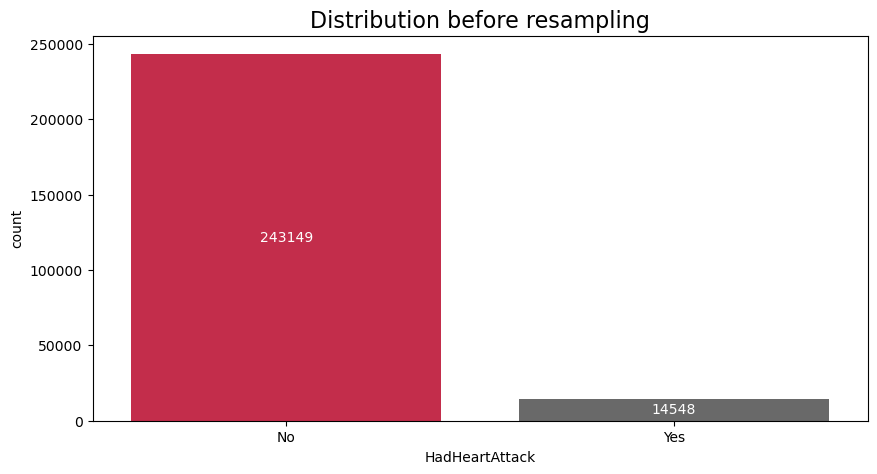

In [28]:
plt.figure(figsize = (10,5))
ax=sns.countplot(data=df , x = 'HadHeartAttack', palette=color_catplot)
for container in ax.containers:
    ax.bar_label(container, label_type='center', rotation=0, color='white')
plt.title("Distribution before resampling", size=16)    
plt.show()